In [1]:
# %%

# =============================================================================
# COMPREHENSIVE MEDIA BIAS NETWORK ANALYSIS
# Research Questions:
# 1. How stable is community detection across different methodologies?
# 2. Can we derive a "true clustering" from consensus results?
# =============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import squareform
from sklearn.metrics import silhouette_score
import networkx as nx
from collections import defaultdict, Counter
import warnings
warnings.filterwarnings('ignore')

from src.experiment import ExperimentFramework
from src.viz import Visualizer

# set style
plt.style.use('default')
sns.set_palette('husl')

In [18]:
# %%

# =============================================================================
# 1. EXPERIMENT SETUP & DATA OVERVIEW
# =============================================================================

print("=== MEDIA BIAS NETWORK ANALYSIS ===")
print("Initializing experiment framework...")

# initialize experiment
data_dir = 'data/daily_cluster_matrices_min_6'
experiment = ExperimentFramework(data_dir)

# run experiment with more samples for robust analysis
n_samples = 20
n_days = 60

print(f"Running experiment: {n_samples} samples × {n_days} days")
experiment_summary = experiment.run_experiment(n_samples=n_samples, n_days=n_days)

analyzer = experiment.analyzer
viz = Visualizer(analyzer)

print(f"\nEXPERIMENT SUMMARY:")
print(f"Total results: {experiment_summary['total_results']}")
print(f"Network methods: {len(analyzer.get_results()['network_method'].unique())}")
print(f"Community methods: {len(analyzer.get_results()['community_method'].unique())}")
print(f"Average time per sample: {experiment_summary['avg_time_per_sample']:.1f}s")

=== MEDIA BIAS NETWORK ANALYSIS ===
Initializing experiment framework...
initializing media bias experiment...
loading 241 daily matrices...
loaded 241 datasets
241 daily files loaded
Running experiment: 20 samples × 60 days

=== starting experiment: 20 samples x 60 days ===

running sample: sample_00
created sample 'sample_00' with 60 days, shape: (49, 18289)
set data: 49 entities, 18289 clusters
built cooccurrence adjacency: (49, 49)
built jaccard adjacency: (49, 49)
built dice adjacency: (49, 49)
built cosine adjacency: (49, 49)
built correlation adjacency: (49, 49)
built pmi adjacency: (49, 49)
built lift adjacency: (49, 49)
built tfidf_similarity adjacency: (49, 49)
built conditional_probability adjacency: (49, 49)

processing cooccurrence adjacency matrix...
louvain params_0: 4 communities
louvain params_1: 3 communities
louvain params_2: 6 communities
louvain params_3: 2 communities
louvain params_4: 2 communities
louvain params_5: 4 communities
louvain params_6: 11 communities


In [62]:
# save unfiltered results
# raw_df = analyzer.get_results()
# raw_df.to_csv('data/unfiltered_results.csv', index=False)

# load unfiltered results
# df = pd.read_csv('data/unfiltered_results.csv')
df = raw_df.copy()

In [64]:
len(df)

10240

In [65]:
# %%

# =============================================================================
# 2. FILTERING ANALYSIS & METHOD ELIMINATION
# =============================================================================

print("\n=== FILTERING ANALYSIS ===")
original_df = df.copy()  # save original before filtering
total_results = len(df)

# analyze distribution before filtering
print(f"Community count distribution (before filtering):")
print(df['n_communities'].describe())

# apply reasonable filtering (2-25 communities)
reasonable_results = df[(df['n_communities'] >= 2) & (df['n_communities'] <= 25)]
filtered_out_results = df[~((df['n_communities'] >= 2) & (df['n_communities'] <= 25))]
filtered_count = len(reasonable_results)
survival_rate = filtered_count / total_results

print(f"\nFILTERING RESULTS:")
print(f"Original results: {total_results}")
print(f"After filtering (2-25 communities): {filtered_count}")
print(f"Filtered out: {len(filtered_out_results)}")
print(f"Survival rate: {survival_rate:.1%}")

# method elimination analysis
method_survival = df.groupby(['network_method', 'community_method']).apply(
    lambda x: ((x['n_communities'] >= 2) & (x['n_communities'] <= 25)).mean()
).reset_index().rename(columns={0: 'survival_rate'})

print(f"\nMETHOD SURVIVAL RATES:")
low_survival = method_survival[method_survival['survival_rate'] < 0.5]
if not low_survival.empty:
    print("Methods with <50% survival:")
    for _, row in low_survival.iterrows():
        print(f"{row['network_method']} + {row['community_method']}: {row['survival_rate']:.1%}")

# update analyzer with filtered results
analyzer.results_df = reasonable_results
print(f"\nFiltered dataset: {len(reasonable_results)} results")
print(f"Filtered out dataset: {len(filtered_out_results)} results")


=== FILTERING ANALYSIS ===
Community count distribution (before filtering):
count    10240.000000
mean         9.194922
std         13.848570
min          1.000000
25%          1.000000
50%          3.000000
75%          8.000000
max         49.000000
Name: n_communities, dtype: float64

FILTERING RESULTS:
Original results: 10240
After filtering (2-25 communities): 4718
Filtered out: 5522
Survival rate: 46.1%

METHOD SURVIVAL RATES:
Methods with <50% survival:
conditional_probability + infomap: 0.0%
conditional_probability + k_cores: 0.0%
conditional_probability + label_propagation: 0.0%
conditional_probability + leiden: 20.0%
conditional_probability + threshold_components: 20.5%
cooccurrence + infomap: 0.0%
cooccurrence + k_cores: 0.0%
cooccurrence + label_propagation: 0.0%
cooccurrence + leiden: 20.0%
correlation + infomap: 0.0%
correlation + label_propagation: 0.0%
correlation + leiden: 0.0%
correlation + louvain: 19.4%
correlation + threshold_components: 0.0%
cosine + infomap: 0.0


=== PERFORMANCE DISTRIBUTIONS ===


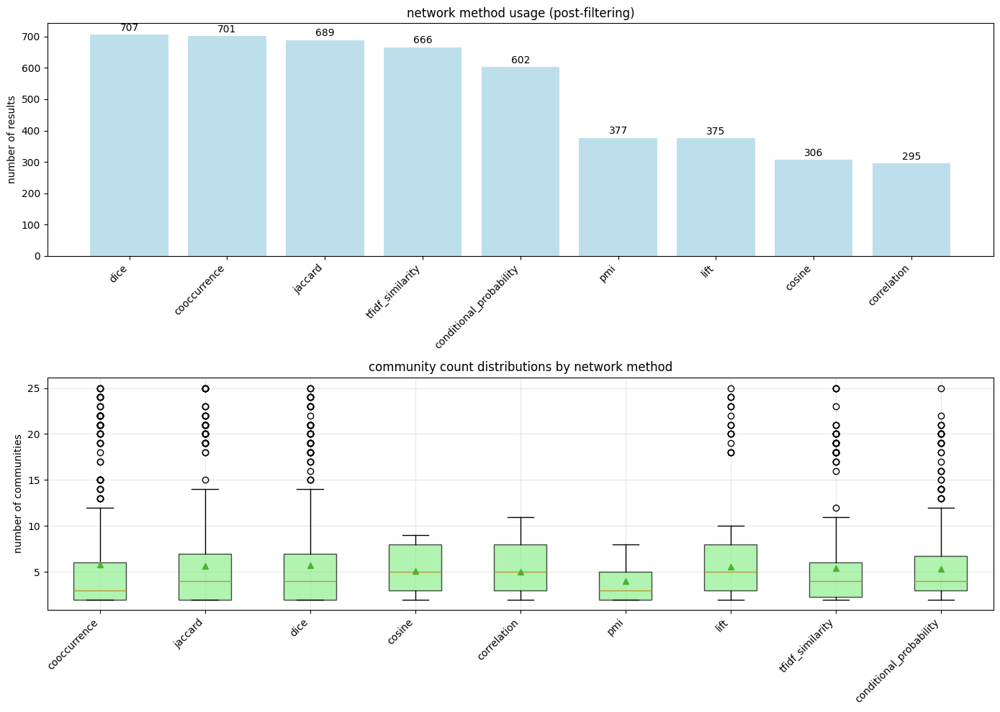

In [66]:
# %%

# =============================================================================
# 3. PERFORMANCE DISTRIBUTIONS - NETWORK METHODS
# =============================================================================

print("\n=== PERFORMANCE DISTRIBUTIONS ===")

df = analyzer.get_results()

# network method distributions
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# bar chart of counts
net_counts = df['network_method'].value_counts()
ax1 = axes[0]
bars = ax1.bar(range(len(net_counts)), net_counts.values, color='lightblue', alpha=0.8)
ax1.set_xticks(range(len(net_counts)))
ax1.set_xticklabels(net_counts.index, rotation=45, ha='right')
ax1.set_ylabel('number of results')
ax1.set_title('network method usage (post-filtering)')
for i, v in enumerate(net_counts.values):
    ax1.text(i, v + 5, str(v), ha='center', va='bottom')

# community count distributions by network method
ax2 = axes[1]
network_methods = df['network_method'].unique()
positions = []
box_data = []
labels = []

for i, method in enumerate(network_methods):
    method_data = df[df['network_method'] == method]['n_communities']
    if len(method_data) > 0:
        box_data.append(method_data)
        positions.append(i)
        labels.append(method)

bp = ax2.boxplot(box_data, positions=positions, patch_artist=True, showmeans=True)
for patch in bp['boxes']:
    patch.set_facecolor('lightgreen')
    patch.set_alpha(0.7)

ax2.set_xticks(positions)
ax2.set_xticklabels(labels, rotation=45, ha='right')
ax2.set_ylabel('number of communities')
ax2.set_title('community count distributions by network method')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


=== PERFORMANCE DISTRIBUTIONS ===


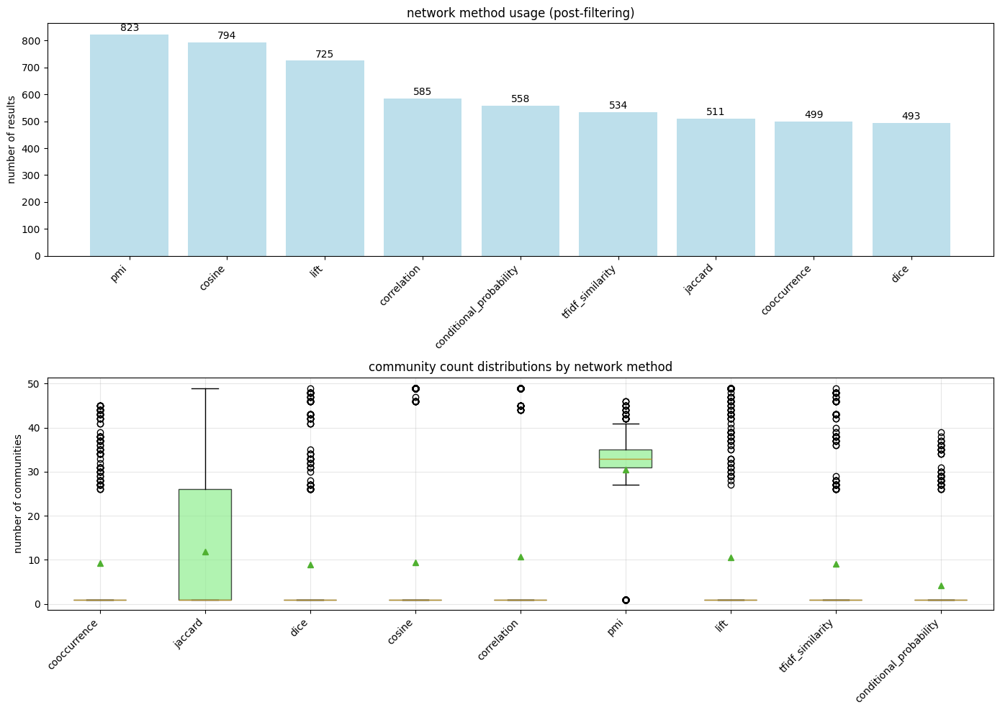

In [67]:
# %%

# =============================================================================
# 3. PERFORMANCE DISTRIBUTIONS - NETWORK METHODS
# =============================================================================

print("\n=== PERFORMANCE DISTRIBUTIONS ===")

# network method distributions
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# bar chart of counts
net_counts = filtered_out_results['network_method'].value_counts()
ax1 = axes[0]
bars = ax1.bar(range(len(net_counts)), net_counts.values, color='lightblue', alpha=0.8)
ax1.set_xticks(range(len(net_counts)))
ax1.set_xticklabels(net_counts.index, rotation=45, ha='right')
ax1.set_ylabel('number of results')
ax1.set_title('network method usage (post-filtering)')
for i, v in enumerate(net_counts.values):
    ax1.text(i, v + 5, str(v), ha='center', va='bottom')

# community count distributions by network method
ax2 = axes[1]
network_methods = filtered_out_results['network_method'].unique()
positions = []
box_data = []
labels = []

for i, method in enumerate(network_methods):
    method_data = filtered_out_results[filtered_out_results['network_method'] == method]['n_communities']
    if len(method_data) > 0:
        box_data.append(method_data)
        positions.append(i)
        labels.append(method)

bp = ax2.boxplot(box_data, positions=positions, patch_artist=True, showmeans=True)
for patch in bp['boxes']:
    patch.set_facecolor('lightgreen')
    patch.set_alpha(0.7)

ax2.set_xticks(positions)
ax2.set_xticklabels(labels, rotation=45, ha='right')
ax2.set_ylabel('number of communities')
ax2.set_title('community count distributions by network method')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


=== FILTERING ANALYSIS ===


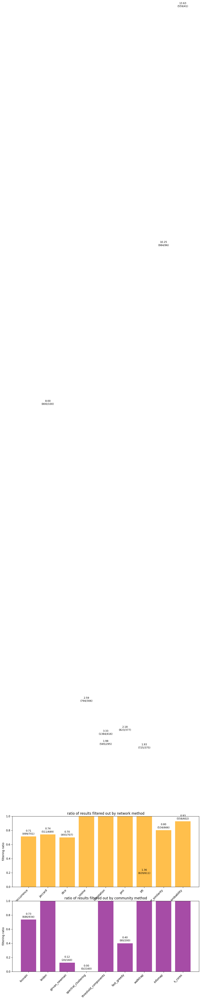

In [91]:
# =============================================================================
# 3.5 FILTERING ANALYSIS - RATIO OF FILTERED RESULTS BY METHOD
# =============================================================================

print("\n=== FILTERING ANALYSIS ===")

# calculate filtering ratios for network methods
network_methods = df['network_method'].unique()
net_filter_data = []

for method in network_methods:
    total = len(df[df['network_method'] == method])
    filtered = len(filtered_out_results[filtered_out_results['network_method'] == method])
    ratio = filtered / total if total > 0 else 0
    net_filter_data.append({
        'method': method,
        'total': total,
        'filtered': filtered,
        'ratio': ratio
    })

# calculate filtering ratios for community methods
comm_methods = df['community_method'].unique()
comm_filter_data = []

for method in comm_methods:
    total = len(df[df['community_method'] == method])
    filtered = len(filtered_out_results[filtered_out_results['community_method'] == method])
    ratio = filtered / total if total > 0 else 0
    comm_filter_data.append({
        'method': method,
        'total': total,
        'filtered': filtered,
        'ratio': ratio
    })

# plot filtering ratios
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# network methods filtering ratios
ax1 = axes[0]
net_methods = [d['method'] for d in net_filter_data]
net_ratios = [d['ratio'] for d in net_filter_data]
bars1 = ax1.bar(range(len(net_methods)), net_ratios, color='orange', alpha=0.7)
ax1.set_xticks(range(len(net_methods)))
ax1.set_xticklabels(net_methods, rotation=45, ha='right')
ax1.set_ylabel('filtering ratio')
ax1.set_title('ratio of results filtered out by network method')
ax1.set_ylim(0, 1)
for i, (ratio, data) in enumerate(zip(net_ratios, net_filter_data)):
    ax1.text(i, ratio + 0.02, f'{ratio:.2f}\n({data["filtered"]}/{data["total"]})', 
             ha='center', va='bottom', fontsize=9)

# community methods filtering ratios
ax2 = axes[1]
comm_methods_list = [d['method'] for d in comm_filter_data]
comm_ratios = [d['ratio'] for d in comm_filter_data]
bars2 = ax2.bar(range(len(comm_methods_list)), comm_ratios, color='purple', alpha=0.7)
ax2.set_xticks(range(len(comm_methods_list)))
ax2.set_xticklabels(comm_methods_list, rotation=45, ha='right')
ax2.set_ylabel('filtering ratio')
ax2.set_title('ratio of results filtered out by community method')
ax2.set_ylim(0, 1)
for i, (ratio, data) in enumerate(zip(comm_ratios, comm_filter_data)):
    ax2.text(i, ratio + 0.02, f'{ratio:.2f}\n({data["filtered"]}/{data["total"]})', 
             ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


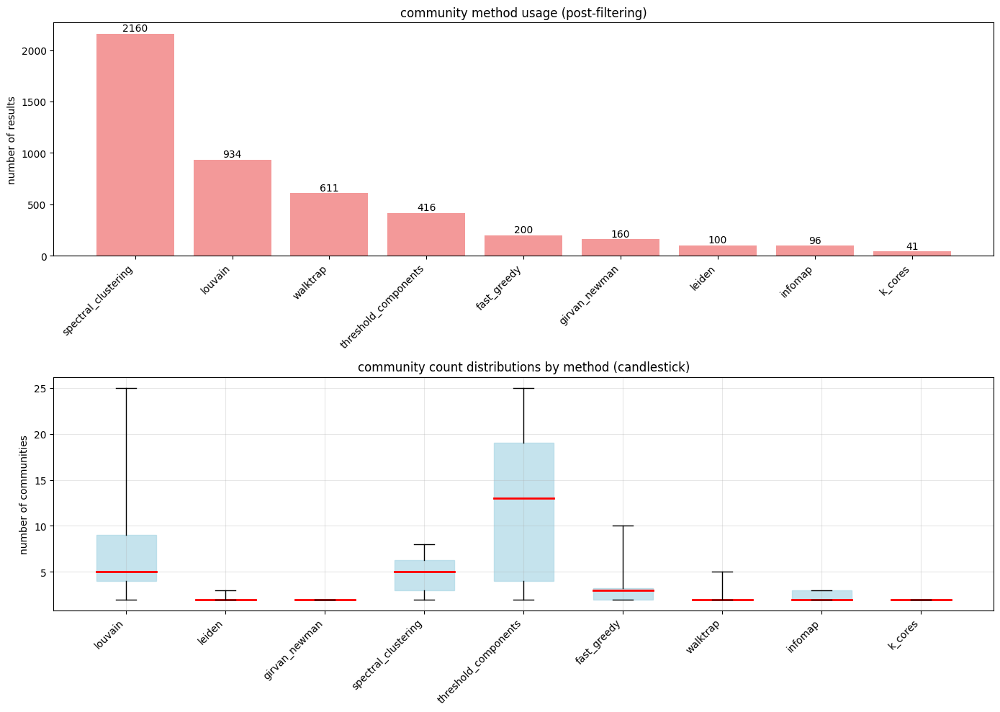

Distribution statistics:
louvain: median=5.0, IQR=5.0, n=934
leiden: median=2.0, IQR=0.0, n=100
girvan_newman: median=2.0, IQR=0.0, n=160
spectral_clustering: median=5.0, IQR=3.2, n=2160
threshold_components: median=13.0, IQR=15.0, n=416
fast_greedy: median=3.0, IQR=1.2, n=200
walktrap: median=2.0, IQR=0.0, n=611
infomap: median=2.0, IQR=1.0, n=96
k_cores: median=2.0, IQR=0.0, n=41


In [69]:
# %%

# =============================================================================
# 4. PERFORMANCE DISTRIBUTIONS - COMMUNITY METHODS
# =============================================================================

# community method distributions
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# bar chart of counts
comm_counts = df['community_method'].value_counts()
ax1 = axes[0]
bars = ax1.bar(range(len(comm_counts)), comm_counts.values, color='lightcoral', alpha=0.8)
ax1.set_xticks(range(len(comm_counts)))
ax1.set_xticklabels(comm_counts.index, rotation=45, ha='right')
ax1.set_ylabel('number of results')
ax1.set_title('community method usage (post-filtering)')
for i, v in enumerate(comm_counts.values):
    ax1.text(i, v + 2, str(v), ha='center', va='bottom')

# candlestick plot for community methods
ax2 = axes[1]
comm_methods = df['community_method'].unique()
stats_data = []

for method in comm_methods:
    method_data = df[df['community_method'] == method]['n_communities']
    if len(method_data) > 5:  # only include methods with sufficient data
        stats_data.append({
            'method': method,
            'min': method_data.min(),
            'q1': method_data.quantile(0.25),
            'median': method_data.median(),
            'q3': method_data.quantile(0.75),
            'max': method_data.max(),
            'count': len(method_data)
        })

# create candlestick visualization
for i, stats in enumerate(stats_data):
    x = i
    # box (q1 to q3)
    ax2.add_patch(plt.Rectangle((x-0.3, stats['q1']), 0.6, stats['q3']-stats['q1'], 
                               color='lightblue', alpha=0.7, edgecolor='black'))
    # median line
    ax2.plot([x-0.3, x+0.3], [stats['median'], stats['median']], color='red', lw=2)
    # whiskers
    ax2.plot([x, x], [stats['min'], stats['q1']], color='black', lw=1)
    ax2.plot([x, x], [stats['q3'], stats['max']], color='black', lw=1)
    # caps
    ax2.plot([x-0.1, x+0.1], [stats['min'], stats['min']], color='black', lw=1)
    ax2.plot([x-0.1, x+0.1], [stats['max'], stats['max']], color='black', lw=1)

ax2.set_xticks(range(len(stats_data)))
ax2.set_xticklabels([s['method'] for s in stats_data], rotation=45, ha='right')
ax2.set_ylabel('number of communities')
ax2.set_title('community count distributions by method (candlestick)')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Distribution statistics:")
for stats in stats_data:
    print(f"{stats['method']}: median={stats['median']:.1f}, IQR={stats['q3']-stats['q1']:.1f}, n={stats['count']}")


=== PARAMETER STABILITY ANALYSIS ===


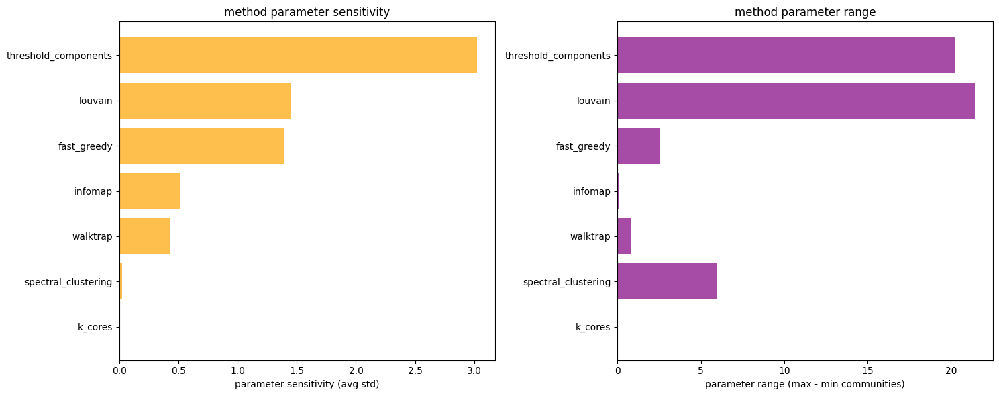


Parameter stability ranking (most stable first):
 1. k_cores: sensitivity=0.00, range=0.0
 2. spectral_clustering: sensitivity=0.02, range=6.0
 3. walktrap: sensitivity=0.43, range=0.8
 4. infomap: sensitivity=0.52, range=0.1
 5. fast_greedy: sensitivity=1.39, range=2.5
 6. louvain: sensitivity=1.45, range=21.4
 7. threshold_components: sensitivity=3.02, range=20.3


In [70]:
# %%

# =============================================================================
# 5. PARAMETER STABILITY ANALYSIS
# =============================================================================

print("\n=== PARAMETER STABILITY ANALYSIS ===")

# analyze parameter sensitivity for key methods
param_analysis = []
for method in df['community_method'].unique():
    method_data = df[df['community_method'] == method]
    if len(method_data) > 10:  # sufficient data
        param_groups = method_data.groupby('param_id')['n_communities']
        if len(param_groups) > 1:  # has multiple parameter sets
            param_std = param_groups.std().mean()  # average std across parameters
            param_range = param_groups.mean().max() - param_groups.mean().min()
            param_analysis.append({
                'method': method,
                'param_sensitivity': param_std,
                'param_range': param_range,
                'n_param_sets': len(param_groups)
            })

if param_analysis:
    param_df = pd.DataFrame(param_analysis).sort_values('param_sensitivity')
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # parameter sensitivity
    ax1.barh(range(len(param_df)), param_df['param_sensitivity'], color='orange', alpha=0.7)
    ax1.set_yticks(range(len(param_df)))
    ax1.set_yticklabels(param_df['method'])
    ax1.set_xlabel('parameter sensitivity (avg std)')
    ax1.set_title('method parameter sensitivity')
    
    # parameter range
    ax2.barh(range(len(param_df)), param_df['param_range'], color='purple', alpha=0.7)
    ax2.set_yticks(range(len(param_df)))
    ax2.set_yticklabels(param_df['method'])
    ax2.set_xlabel('parameter range (max - min communities)')
    ax2.set_title('method parameter range')
    
    plt.tight_layout()
    plt.show()
    
    print("\nParameter stability ranking (most stable first):")
    for i, (_, row) in enumerate(param_df.iterrows(), 1):
        print(f"{i:2d}. {row['method']}: sensitivity={row['param_sensitivity']:.2f}, range={row['param_range']:.1f}")


=== NETWORK PROPERTY ANALYSIS ===


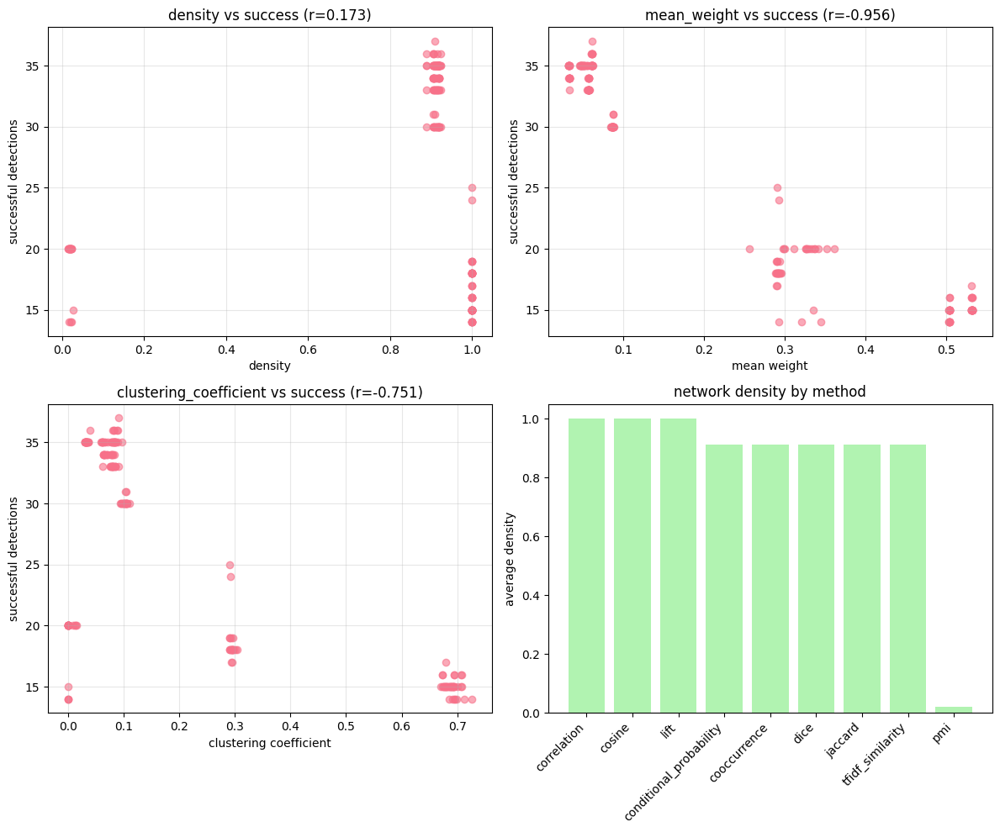

Network property summary:
density: mean=0.842, std=0.294
mean_weight: mean=0.216, std=0.191
clustering_coefficient: mean=0.227, std=0.260


In [32]:
# %%

# =============================================================================
# 6. NETWORK PROPERTY CORRELATION ANALYSIS
# =============================================================================

print("\n=== NETWORK PROPERTY ANALYSIS ===")

# compute network properties for each adjacency matrix
network_properties = []
adjacencies = analyzer.adjacencies

for (sample_id, network_method), adj_matrix in adjacencies.items():
    # convert to numpy array
    adj_array = adj_matrix.values if hasattr(adj_matrix, 'values') else adj_matrix
    
    # basic properties
    density = np.count_nonzero(adj_array) / (adj_array.shape[0] * adj_array.shape[1])
    mean_weight = np.mean(adj_array[adj_array > 0]) if np.any(adj_array > 0) else 0
    weight_std = np.std(adj_array[adj_array > 0]) if np.any(adj_array > 0) else 0
    
    # networkx properties (for connected graph metrics)
    try:
        G = nx.from_numpy_array(adj_array)
        if G.number_of_edges() > 0:
            clustering_coef = nx.average_clustering(G, weight='weight')
            try:
                # only compute if graph is connected
                if nx.is_connected(G):
                    avg_path_length = nx.average_shortest_path_length(G, weight='weight')
                else:
                    avg_path_length = np.nan
            except:
                avg_path_length = np.nan
        else:
            clustering_coef = 0
            avg_path_length = np.nan
    except:
        clustering_coef = np.nan
        avg_path_length = np.nan
    
    network_properties.append({
        'sample_id': sample_id,
        'network_method': network_method,
        'density': density,
        'mean_weight': mean_weight,
        'weight_std': weight_std,
        'clustering_coefficient': clustering_coef,
        'avg_path_length': avg_path_length
    })

net_props_df = pd.DataFrame(network_properties)

# correlate with method success rates
method_success = df.groupby(['sample_id', 'network_method']).apply(
    lambda x: len(x)  # number of successful community detections
).reset_index().rename(columns={0: 'success_count'})

# merge with network properties
correlation_data = net_props_df.merge(method_success, on=['sample_id', 'network_method'])

# plot correlations
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

properties = ['density', 'mean_weight', 'clustering_coefficient', 'success_count']
for i, prop in enumerate(properties[:-1]):
    ax = axes[i//2, i%2]
    valid_data = correlation_data.dropna(subset=[prop, 'success_count'])
    if len(valid_data) > 5:
        ax.scatter(valid_data[prop], valid_data['success_count'], alpha=0.6)
        # add correlation coefficient
        corr_coef = valid_data[prop].corr(valid_data['success_count'])
        ax.set_xlabel(prop.replace('_', ' '))
        ax.set_ylabel('successful detections')
        ax.set_title(f'{prop} vs success (r={corr_coef:.3f})')
        ax.grid(True, alpha=0.3)

# method comparison by properties
ax = axes[1, 1]
net_method_props = net_props_df.groupby('network_method')['density'].mean().sort_values(ascending=False)
ax.bar(range(len(net_method_props)), net_method_props.values, color='lightgreen', alpha=0.7)
ax.set_xticks(range(len(net_method_props)))
ax.set_xticklabels(net_method_props.index, rotation=45, ha='right')
ax.set_ylabel('average density')
ax.set_title('network density by method')

plt.tight_layout()
plt.show()

print("Network property summary:")
for prop in ['density', 'mean_weight', 'clustering_coefficient']:
    values = net_props_df[prop].dropna()
    if len(values) > 0:
        print(f"{prop}: mean={values.mean():.3f}, std={values.std():.3f}")


=== METHOD SIMILARITY ANALYSIS ===
Computing similarities for sample_00 - cooccurrence


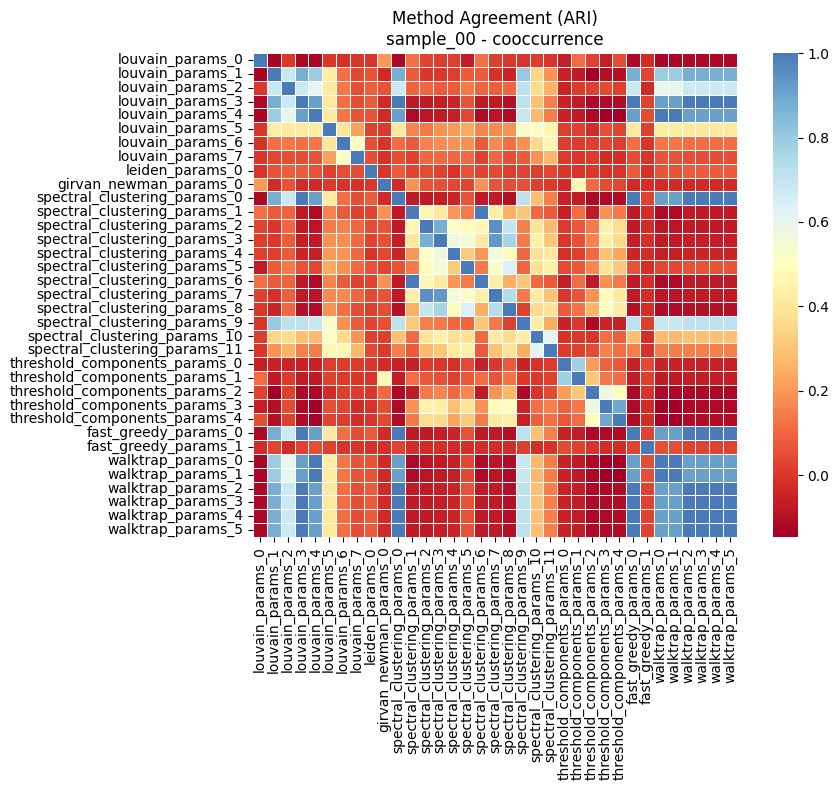

Computing similarities for sample_00 - jaccard


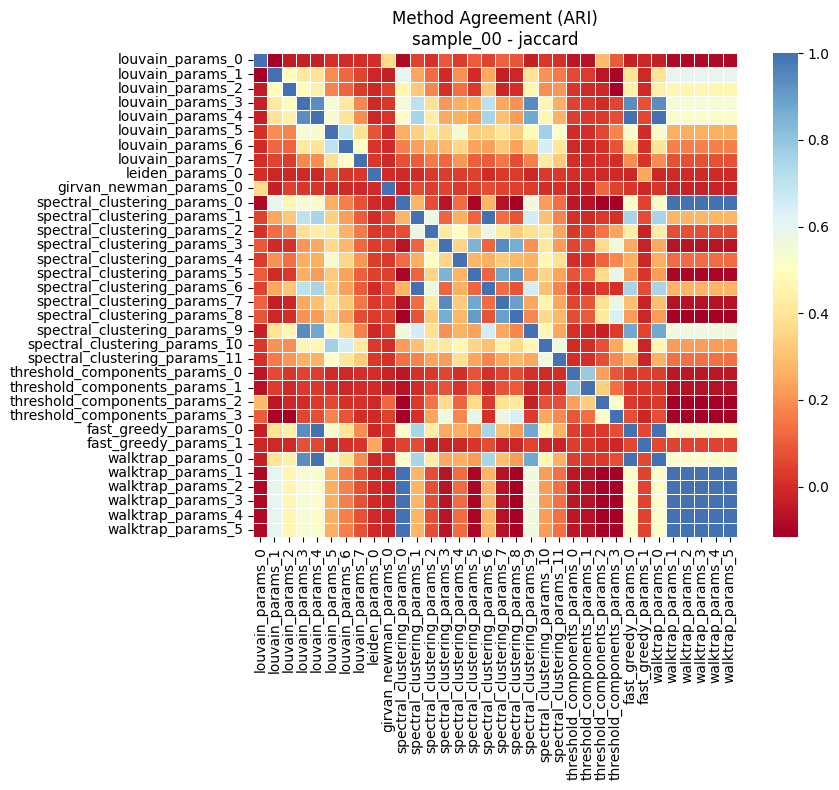

Computing similarities for sample_01 - cooccurrence


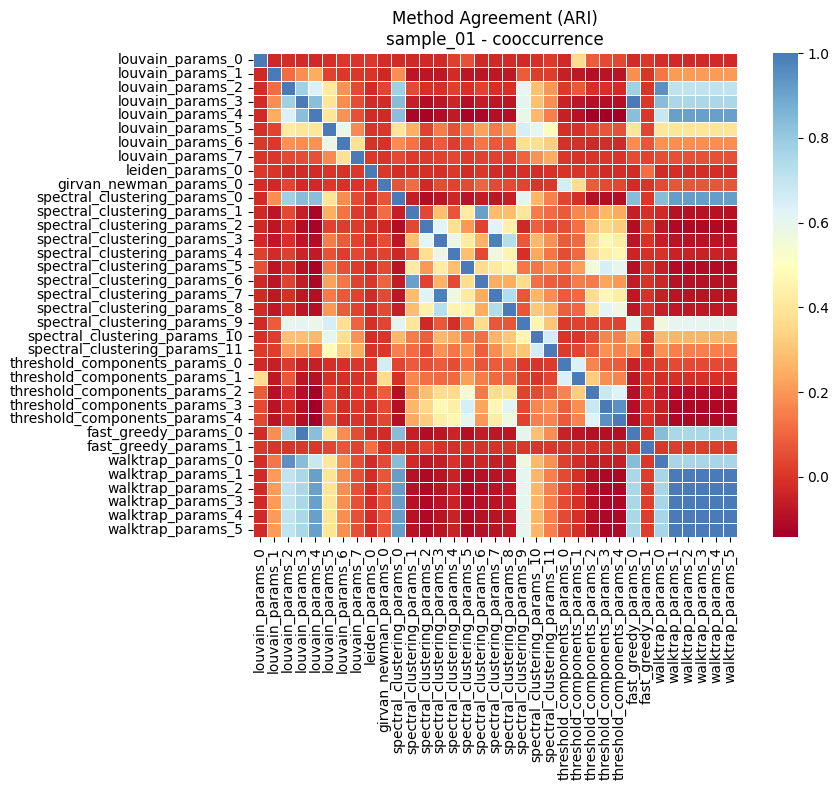

Computing similarities for sample_01 - jaccard


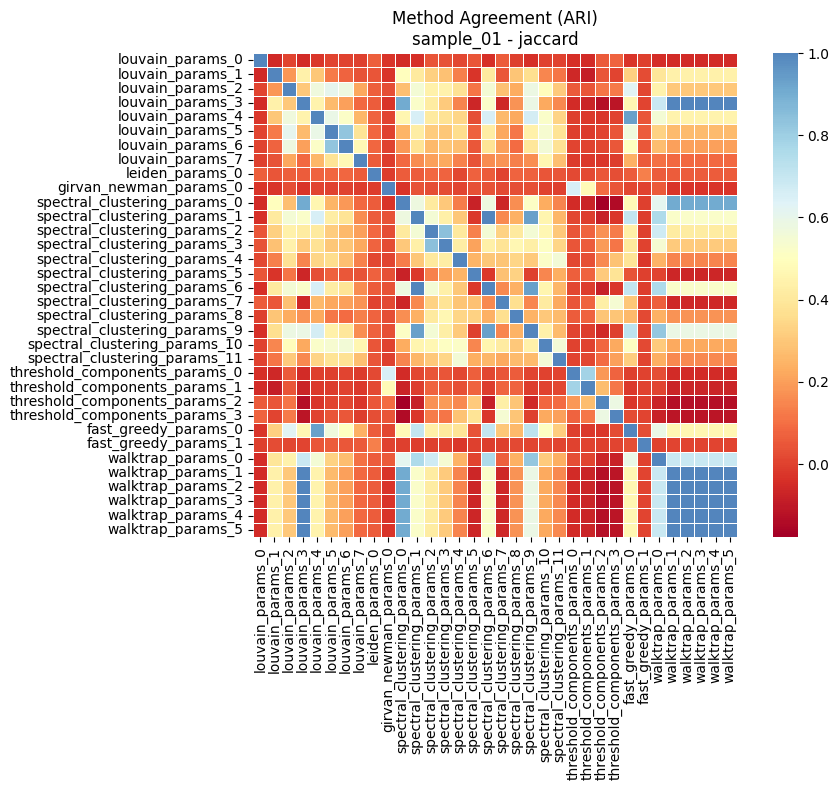

Computing similarities for sample_02 - cooccurrence


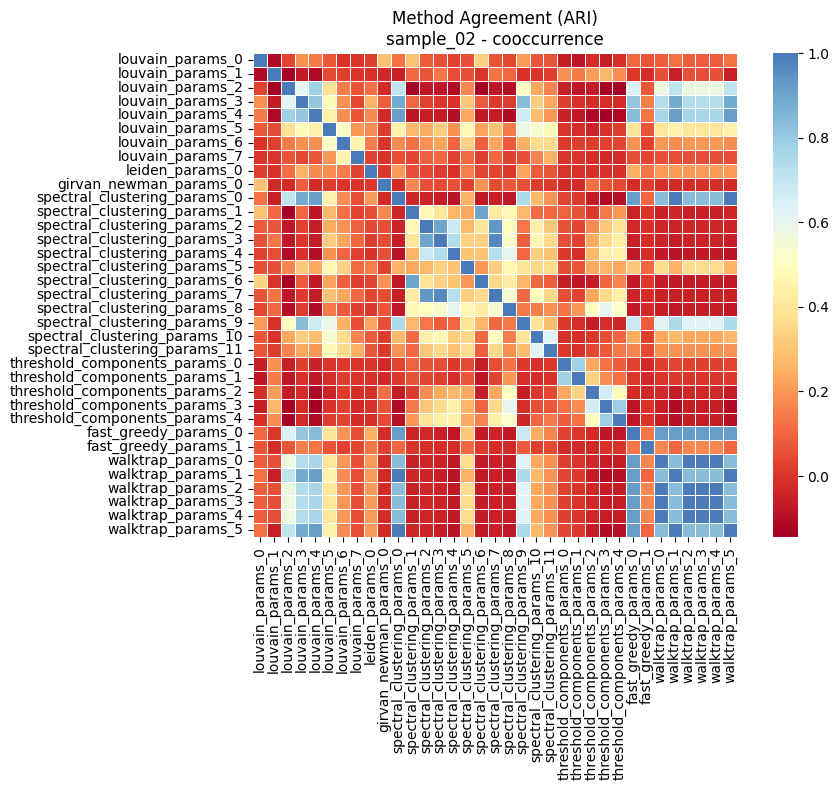

Computing similarities for sample_02 - jaccard


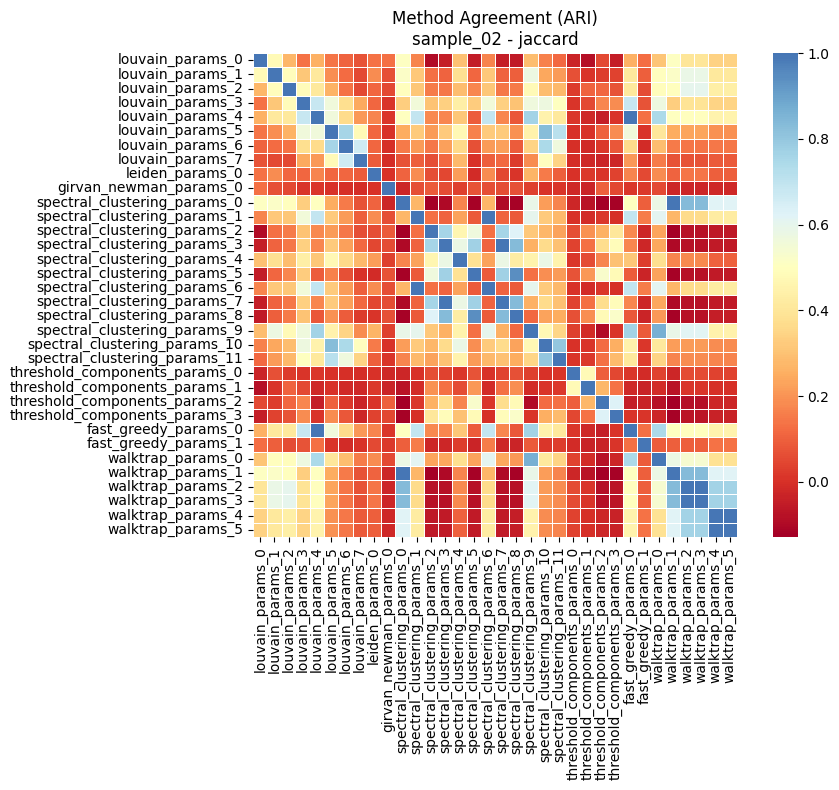


OVERALL METHOD AGREEMENT:
Mean ARI: 0.203
Std ARI: 0.285
High agreement (ARI > 0.7): 8.6%
Low agreement (ARI < 0.3): 71.7%


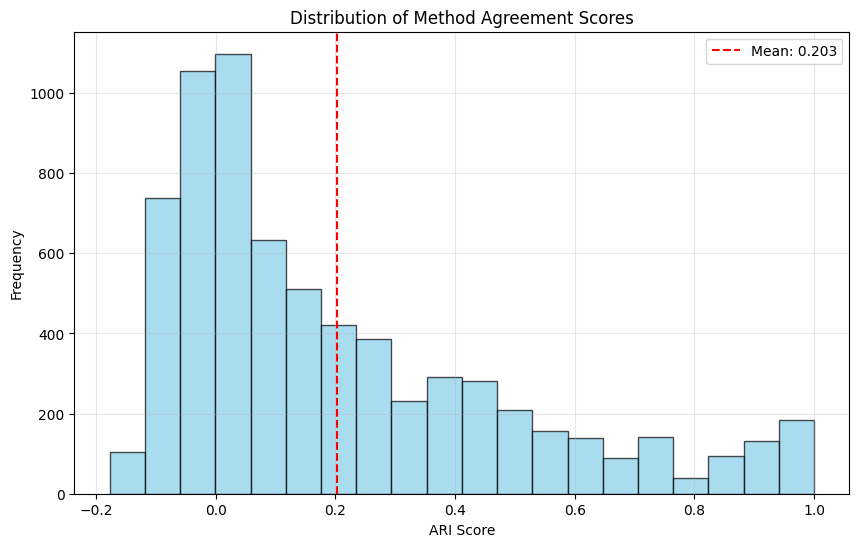

In [71]:
# %%

# =============================================================================
# 7. METHOD SIMILARITY & CONSENSUS ANALYSIS
# =============================================================================

print("\n=== METHOD SIMILARITY ANALYSIS ===")

# calculate pairwise similarities between all method combinations
samples = analyzer.get_results()['sample_id'].unique()
similarity_results = []

# select representative samples for detailed analysis
analysis_samples = samples[:3] if len(samples) >= 3 else samples

for sample_id in analysis_samples:
    sample_results = analyzer.get_results({'sample_id': sample_id})
    network_methods = sample_results['network_method'].unique()
    
    for network_method in network_methods[:2]:  # limit to first 2 network methods
        print(f"Computing similarities for {sample_id} - {network_method}")
        similarity_matrix = analyzer.calculate_method_similarity(sample_id, network_method, metric='ari')
        
        if not similarity_matrix.empty and similarity_matrix.shape[0] > 1:
            # extract upper triangle (excluding diagonal)
            mask = ~np.eye(similarity_matrix.shape[0], dtype=bool)
            similarities = similarity_matrix.values[mask]
            
            similarity_results.extend([{
                'sample_id': sample_id,
                'network_method': network_method,
                'ari_score': score
            } for score in similarities])
            
            # visualize similarity matrix
            plt.figure(figsize=(10, 8))
            sns.heatmap(similarity_matrix, annot=False, cmap='RdYlBu', center=0.5,
                       square=True, linewidths=0.5)
            plt.title(f'Method Agreement (ARI)\n{sample_id} - {network_method}')
            plt.tight_layout()
            plt.show()

# overall similarity analysis
if similarity_results:
    sim_df = pd.DataFrame(similarity_results)
    
    print(f"\nOVERALL METHOD AGREEMENT:")
    print(f"Mean ARI: {sim_df['ari_score'].mean():.3f}")
    print(f"Std ARI: {sim_df['ari_score'].std():.3f}")
    print(f"High agreement (ARI > 0.7): {(sim_df['ari_score'] > 0.7).mean():.1%}")
    print(f"Low agreement (ARI < 0.3): {(sim_df['ari_score'] < 0.3).mean():.1%}")
    
    # distribution of similarities
    plt.figure(figsize=(10, 6))
    plt.hist(sim_df['ari_score'], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    plt.axvline(sim_df['ari_score'].mean(), color='red', linestyle='--', 
                label=f'Mean: {sim_df["ari_score"].mean():.3f}')
    plt.xlabel('ARI Score')
    plt.ylabel('Frequency')
    plt.title('Distribution of Method Agreement Scores')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [37]:
sim_df

,sample_id,network_method,ari_score
0,sample_00,cooccurrence,0.067421
1,sample_00,cooccurrence,0.138547
2,sample_00,cooccurrence,0.141383
3,sample_00,cooccurrence,0.095327
4,sample_00,cooccurrence,0.033564
...,...,...,...
6999,sample_02,jaccard,0.480387
7000,sample_02,jaccard,0.915493
7001,sample_02,jaccard,0.915493
7002,sample_02,jaccard,1.000000


In [72]:
# %%
# =============================================================================
# 7.5. COMPREHENSIVE PAIRWISE ARI ANALYSIS - SAMPLED PAIRS
# =============================================================================

print("\n=== COMPREHENSIVE PAIRWISE ARI ANALYSIS (SAMPLED) ===")

from sklearn.metrics import adjusted_rand_score
from itertools import combinations
import pandas as pd
import random

# get all results
all_results = analyzer.get_results()

# filter out methods with less than 100 examples
method_counts = all_results['community_method'].value_counts()
print(f"\nMethod counts before filtering:")
print(method_counts)

methods_to_keep = method_counts[method_counts >= 100].index
all_results = all_results[all_results['community_method'].isin(methods_to_keep)]

print(f"\nMethods kept (>= 100 examples): {list(methods_to_keep)}")
print(f"Filtered results: {len(all_results)} rows")


print(f"Total runs available: {len(all_results)}")

# DEBUG: Check the format of communities data
print("\n=== DEBUGGING COMMUNITIES DATA FORMAT ===")
sample_row = all_results.iloc[0]
print(f"Sample row columns: {list(all_results.columns)}")
print(f"Communities column type: {type(sample_row['communities'])}")
print(f"Communities value: {sample_row['communities']}")
print(f"Communities repr: {repr(sample_row['communities'])}")

# Check a few more rows
print(f"\nChecking first 3 rows:")
for i in range(min(3, len(all_results))):
    row = all_results.iloc[i]
    print(f"Row {i}: type={type(row['communities'])}, value={repr(row['communities'])}")

# create comprehensive pairwise ARI dataframe
pairwise_ari_data = []

# get all unique run combinations and sample 50,000 pairs
results_list = all_results.to_dict('records')
all_pairs = [(i, j) for i in range(len(results_list)) for j in range(i+1, len(results_list))]

# sample 50,000 pairs or all pairs if fewer available
n_sample_pairs = min(50000, len(all_pairs))
sampled_pairs = random.sample(all_pairs, n_sample_pairs)

print(f"Sampling {n_sample_pairs} pairs from {len(all_pairs)} total possible pairs")
print("Computing pairwise ARI scores...")

for pair_idx, (i, j) in enumerate(sampled_pairs):
    if pair_idx % 1000 == 0:
        print(f"Processed {pair_idx}/{n_sample_pairs} pairs ({pair_idx/n_sample_pairs*100:.1f}%)")
    
    run1 = results_list[i]
    run2 = results_list[j]
    
    # extract community assignments
    communities1 = run1['communities']
    communities2 = run2['communities']
    
    # parse string representations back to dictionaries
    import ast
    try:
        if isinstance(communities1, str):
            communities1 = ast.literal_eval(communities1)
        if isinstance(communities2, str):
            communities2 = ast.literal_eval(communities2)
    except (ValueError, SyntaxError):
        continue  # skip if can't parse
    
    # ensure both have community assignments
    if communities1 and communities2 and isinstance(communities1, dict) and isinstance(communities2, dict):
        # get common outlets (intersection of both community assignments)
        common_outlets = set(communities1.keys()) & set(communities2.keys())
        
        if len(common_outlets) > 1:  # need at least 2 outlets for meaningful ARI
            # create aligned community vectors
            labels1 = [communities1[outlet] for outlet in sorted(common_outlets)]
            labels2 = [communities2[outlet] for outlet in sorted(common_outlets)]
            
            # calculate ARI
            ari_score = adjusted_rand_score(labels1, labels2)
            
            # store comprehensive information
            pairwise_ari_data.append({
                # run identifiers
                'run1_id': f"{run1['sample_id']}_{run1['network_method']}_{run1['community_method']}_{run1['param_id']}",
                'run2_id': f"{run2['sample_id']}_{run2['network_method']}_{run2['community_method']}_{run2['param_id']}",
                
                # ARI score
                'ari_score': ari_score,
                
                # run1 metadata
                'run1_sample': run1['sample_id'],
                'run1_network_method': run1['network_method'],
                'run1_community_method': run1['community_method'],
                'run1_param_id': run1['param_id'],
                'run1_n_communities': run1['n_communities'],
                
                # run2 metadata
                'run2_sample': run2['sample_id'],
                'run2_network_method': run2['network_method'],
                'run2_community_method': run2['community_method'],
                'run2_param_id': run2['param_id'],
                'run2_n_communities': run2['n_communities'],
                
                # comparison metadata
                'same_sample': run1['sample_id'] == run2['sample_id'],
                'same_network_method': run1['network_method'] == run2['network_method'],
                'same_community_method': run1['community_method'] == run2['community_method'],
                'same_param_id': run1['param_id'] == run2['param_id'],
                'common_outlets': len(common_outlets),
                
                # comparison type
                'comparison_type': (
                    'same_method_same_sample' if (run1['sample_id'] == run2['sample_id'] and 
                                                run1['network_method'] == run2['network_method'] and 
                                                run1['community_method'] == run2['community_method']) else
                    'same_method_diff_sample' if (run1['network_method'] == run2['network_method'] and 
                                                run1['community_method'] == run2['community_method']) else
                    'same_sample_diff_method' if run1['sample_id'] == run2['sample_id'] else
                    'diff_method_diff_sample'
                )
            })

print(f"\nCompleted! Generated {len(pairwise_ari_data)} pairwise comparisons")

# create comprehensive dataframe
comprehensive_ari_df = pd.DataFrame(pairwise_ari_data)

# save to CSV
comprehensive_ari_df.to_csv('data/comprehensive_pairwise_ari_sampled.csv', index=False)
print(f"Saved comprehensive ARI dataframe to 'data/comprehensive_pairwise_ari_sampled.csv'")

# display summary statistics
print(f"\nCOMPREHENSIVE ARI SUMMARY:")
print(f"Total pairwise comparisons: {len(comprehensive_ari_df)}")
print(f"Mean ARI: {comprehensive_ari_df['ari_score'].mean():.3f}")
print(f"Std ARI: {comprehensive_ari_df['ari_score'].std():.3f}")
print(f"Min ARI: {comprehensive_ari_df['ari_score'].min():.3f}")
print(f"Max ARI: {comprehensive_ari_df['ari_score'].max():.3f}")

# breakdown by comparison type
print(f"\nBREAKDOWN BY COMPARISON TYPE:")
comparison_stats = comprehensive_ari_df.groupby('comparison_type')['ari_score'].agg(['count', 'mean', 'std']).round(3)
print(comparison_stats)

# show first few rows
print(f"\nFIRST 5 ROWS:")
print(comprehensive_ari_df.head())



=== COMPREHENSIVE PAIRWISE ARI ANALYSIS (SAMPLED) ===

Method counts before filtering:
community_method
spectral_clustering     2160
louvain                  934
walktrap                 611
threshold_components     416
fast_greedy              200
girvan_newman            160
leiden                   100
infomap                   96
k_cores                   41
Name: count, dtype: int64

Methods kept (>= 100 examples): ['spectral_clustering', 'louvain', 'walktrap', 'threshold_components', 'fast_greedy', 'girvan_newman', 'leiden']
Filtered results: 4581 rows
Total runs available: 4581

=== DEBUGGING COMMUNITIES DATA FORMAT ===
Sample row columns: ['sample_id', 'network_method', 'community_method', 'param_id', 'parameters', 'n_communities', 'largest_community', 'communities']
Communities column type: <class 'dict'>
Communities value: {0: 2, 1: 3, 2: 2, 3: 2, 4: 2, 5: 2, 6: 2, 7: 2, 8: 2, 9: 2, 10: 2, 11: 2, 12: 0, 13: 2, 14: 2, 15: 3, 16: 2, 17: 2, 18: 2, 19: 2, 20: 2, 21: 2, 22: 2, 23

In [73]:
comprehensive_ari_df

,run1_id,run2_id,ari_score,run1_sample,run1_network_method,run1_community_method,run1_param_id,run1_n_communities,run2_sample,run2_network_method,run2_community_method,run2_param_id,run2_n_communities,same_sample,same_network_method,same_community_method,same_param_id,common_outlets,comparison_type
0,sample_11_cooccurrence_spectral_clustering_par...,sample_11_dice_louvain_params_6,0.180479,sample_11,cooccurrence,spectral_clustering,params_9,3,sample_11,dice,louvain,params_6,9,True,False,False,False,49,same_sample_diff_method
1,sample_05_cooccurrence_walktrap_params_3,sample_06_jaccard_louvain_params_6,0.135025,sample_05,cooccurrence,walktrap,params_3,2,sample_06,jaccard,louvain,params_6,8,False,False,False,False,49,diff_method_diff_sample
2,sample_06_dice_spectral_clustering_params_2,sample_18_conditional_probability_louvain_para...,0.287402,sample_06,dice,spectral_clustering,params_2,4,sample_18,conditional_probability,louvain,params_4,3,False,False,False,False,49,diff_method_diff_sample
3,sample_03_conditional_probability_spectral_clu...,sample_08_tfidf_similarity_walktrap_params_3,0.508568,sample_03,conditional_probability,spectral_clustering,params_2,4,sample_08,tfidf_similarity,walktrap,params_3,2,False,False,False,False,49,diff_method_diff_sample
4,sample_05_cooccurrence_louvain_params_4,sample_06_dice_louvain_params_0,0.186315,sample_05,cooccurrence,louvain,params_4,3,sample_06,dice,louvain,params_0,5,False,False,True,False,49,diff_method_diff_sample
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,sample_07_cosine_louvain_params_4,sample_12_dice_spectral_clustering_params_0,0.199765,sample_07,cosine,louvain,params_4,7,sample_12,dice,spectral_clustering,params_0,2,False,False,False,False,49,diff_method_diff_sample
49996,sample_09_conditional_probability_spectral_clu...,sample_18_lift_spectral_clustering_params_7,-0.034767,sample_09,conditional_probability,spectral_clustering,params_7,5,sample_18,lift,spectral_clustering,params_7,5,False,False,True,True,49,diff_method_diff_sample
49997,sample_00_correlation_louvain_params_3,sample_19_jaccard_threshold_components_params_0,-0.030744,sample_00,correlation,louvain,params_3,3,sample_19,jaccard,threshold_components,params_0,2,False,False,False,False,49,diff_method_diff_sample
49998,sample_03_cooccurrence_louvain_params_0,sample_14_jaccard_spectral_clustering_params_4,0.186031,sample_03,cooccurrence,louvain,params_0,5,sample_14,jaccard,spectral_clustering,params_4,6,False,False,False,False,49,diff_method_diff_sample


=== COMPREHENSIVE ARI ANALYSIS ===
Dataset shape: (50000, 19)
Columns: ['run1_id', 'run2_id', 'ari_score', 'run1_sample', 'run1_network_method', 'run1_community_method', 'run1_param_id', 'run1_n_communities', 'run2_sample', 'run2_network_method', 'run2_community_method', 'run2_param_id', 'run2_n_communities', 'same_sample', 'same_network_method', 'same_community_method', 'same_param_id', 'common_outlets', 'comparison_type']

1. OVERALL ARI DISTRIBUTION:
Mean ARI: 0.171
Median ARI: 0.100
Std ARI: 0.224
Min ARI: -0.386
Max ARI: 1.000
Q1: 0.002, Q2: 0.100, Q3: 0.295

Agreement Categories:
High agreement (>0.7): 3.2%
Medium agreement (0.3-0.7): 21.3%
Low agreement (≤0.3): 75.5%

2. ANALYSIS BY COMPARISON TYPE:
                         count   mean    std    min  max  high_agreement_rate  \
comparison_type                                                                 
diff_method_diff_sample  45799  0.162  0.217 -0.386  1.0                0.028   
same_method_diff_sample   1766  0.397  0.

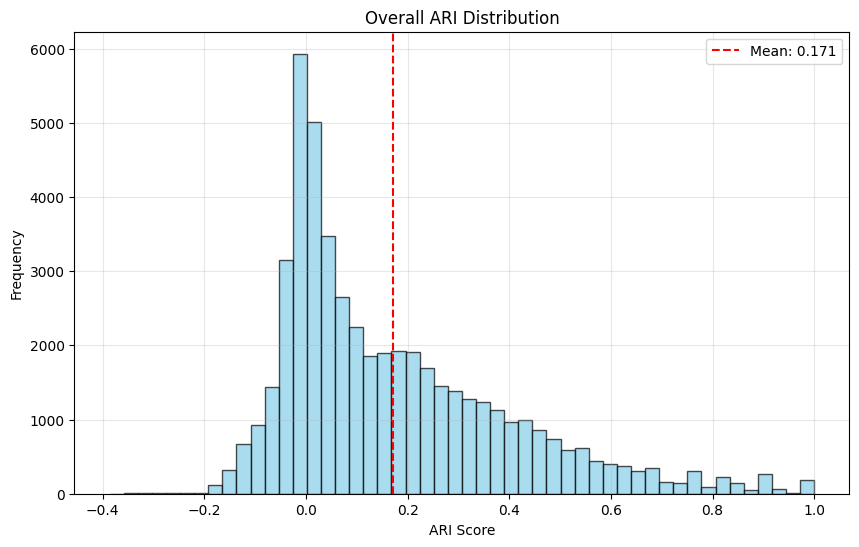

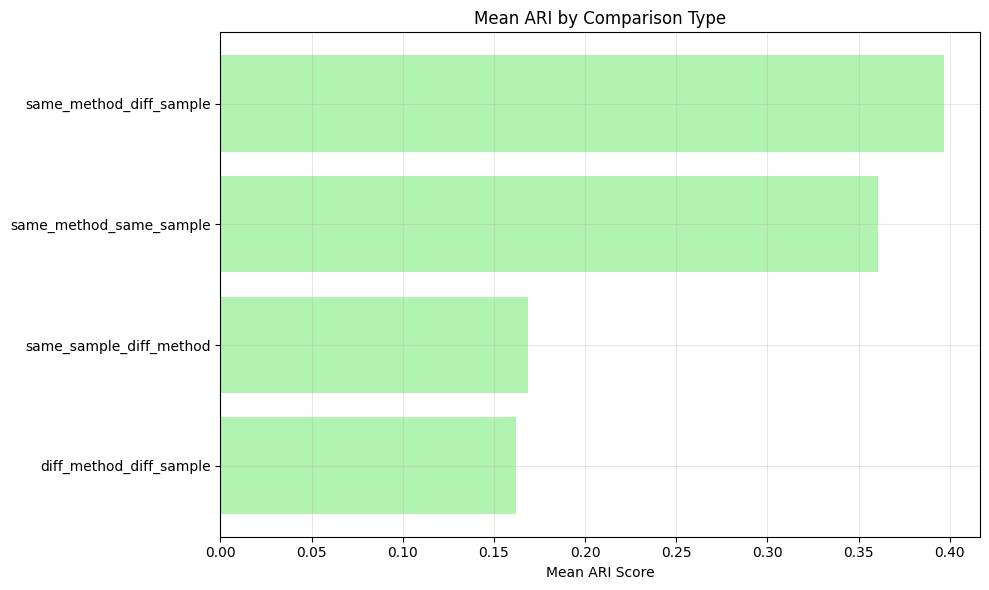

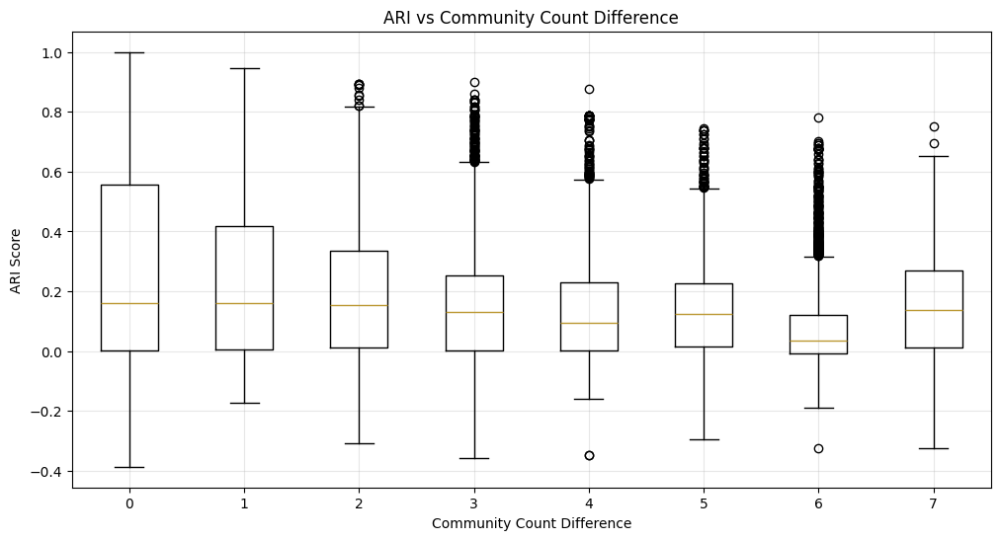

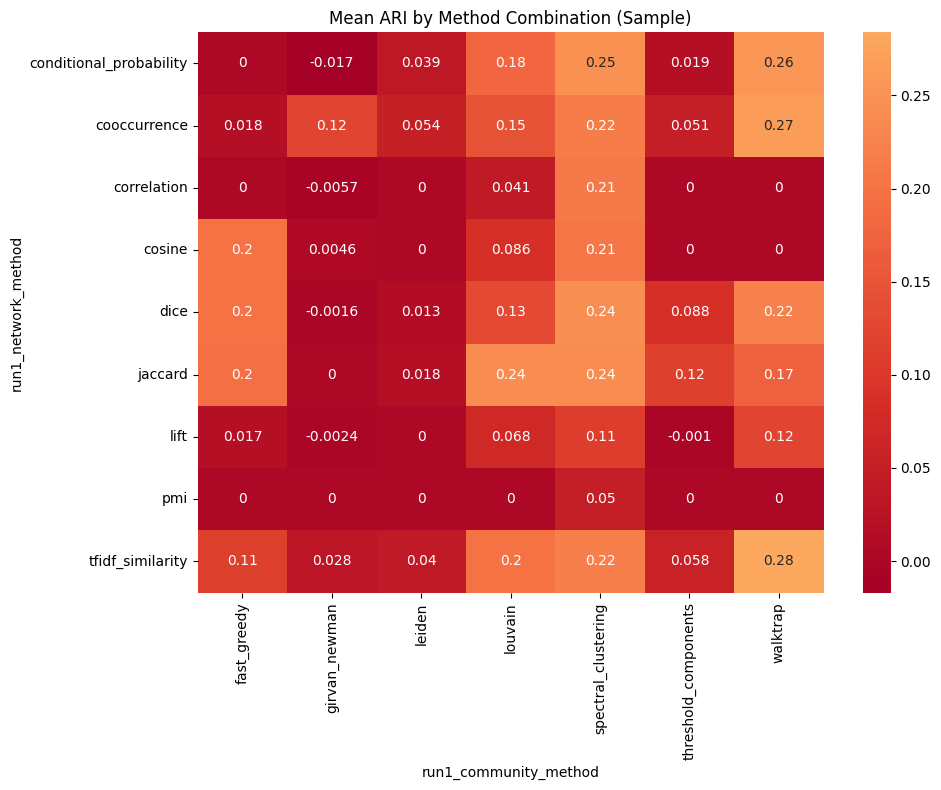


=== KEY INSIGHTS SUMMARY ===
1. Most stable comparison type: same_method_diff_sample (Mean ARI: 0.397)
2. Least stable comparison type: diff_method_diff_sample (Mean ARI: 0.162)
3. Overall consensus level: WEAK (Mean ARI: 0.171)
4. Most temporally stable method: ('tfidf_similarity', 'girvan_newman') (Mean ARI: 1.000)
5. Agreement distribution: 3.2% high, 21.3% medium, 75.5% low


In [74]:
# %%
# =============================================================================
# COMPREHENSIVE ARI DATAFRAME ANALYSIS
# =============================================================================

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the data if not already in memory
# comprehensive_ari_df = pd.read_csv('data/comprehensive_pairwise_ari_sampled.csv')

print("=== COMPREHENSIVE ARI ANALYSIS ===")
print(f"Dataset shape: {comprehensive_ari_df.shape}")
print(f"Columns: {list(comprehensive_ari_df.columns)}")

# %%
# 1. OVERALL DISTRIBUTION ANALYSIS
print("\n1. OVERALL ARI DISTRIBUTION:")
print(f"Mean ARI: {comprehensive_ari_df['ari_score'].mean():.3f}")
print(f"Median ARI: {comprehensive_ari_df['ari_score'].median():.3f}")
print(f"Std ARI: {comprehensive_ari_df['ari_score'].std():.3f}")
print(f"Min ARI: {comprehensive_ari_df['ari_score'].min():.3f}")
print(f"Max ARI: {comprehensive_ari_df['ari_score'].max():.3f}")

# Distribution by quartiles
quartiles = comprehensive_ari_df['ari_score'].quantile([0.25, 0.5, 0.75])
print(f"Q1: {quartiles[0.25]:.3f}, Q2: {quartiles[0.5]:.3f}, Q3: {quartiles[0.75]:.3f}")

# Agreement categories
high_agreement = (comprehensive_ari_df['ari_score'] > 0.7).mean()
medium_agreement = ((comprehensive_ari_df['ari_score'] > 0.3) & (comprehensive_ari_df['ari_score'] <= 0.7)).mean()
low_agreement = (comprehensive_ari_df['ari_score'] <= 0.3).mean()

print(f"\nAgreement Categories:")
print(f"High agreement (>0.7): {high_agreement:.1%}")
print(f"Medium agreement (0.3-0.7): {medium_agreement:.1%}")
print(f"Low agreement (≤0.3): {low_agreement:.1%}")

# %%
# 2. COMPARISON TYPE ANALYSIS
print("\n2. ANALYSIS BY COMPARISON TYPE:")
comparison_analysis = comprehensive_ari_df.groupby('comparison_type')['ari_score'].agg([
    'count', 'mean', 'std', 'min', 'max', 
    lambda x: (x > 0.7).mean(),  # high agreement rate
    lambda x: (x <= 0.3).mean()  # low agreement rate
]).round(3)
comparison_analysis.columns = ['count', 'mean', 'std', 'min', 'max', 'high_agreement_rate', 'low_agreement_rate']
print(comparison_analysis)

# %%
# 3. METHOD STABILITY ANALYSIS
print("\n3. NETWORK METHOD STABILITY:")
# Same community method, different network methods
network_stability = comprehensive_ari_df[
    (comprehensive_ari_df['same_community_method'] == True) & 
    (comprehensive_ari_df['same_network_method'] == False)
].groupby(['run1_community_method'])['ari_score'].agg(['count', 'mean', 'std']).round(3)
print("Stability across network methods (same community method):")
print(network_stability.sort_values('mean', ascending=False))

print("\n4. COMMUNITY METHOD STABILITY:")
# Same network method, different community methods
community_stability = comprehensive_ari_df[
    (comprehensive_ari_df['same_network_method'] == True) & 
    (comprehensive_ari_df['same_community_method'] == False)
].groupby(['run1_network_method'])['ari_score'].agg(['count', 'mean', 'std']).round(3)
print("Stability across community methods (same network method):")
print(community_stability.sort_values('mean', ascending=False))

# %%
# 5. TEMPORAL STABILITY ANALYSIS
print("\n5. TEMPORAL STABILITY (Same methods, different samples):")
temporal_stability = comprehensive_ari_df[
    (comprehensive_ari_df['same_network_method'] == True) & 
    (comprehensive_ari_df['same_community_method'] == True) &
    (comprehensive_ari_df['same_sample'] == False)
].groupby(['run1_network_method', 'run1_community_method'])['ari_score'].agg(['count', 'mean', 'std']).round(3)
print("Top 10 most temporally stable method combinations:")
print(temporal_stability.sort_values('mean', ascending=False).head(10))

# %%
# 6. PARAMETER SENSITIVITY ANALYSIS
print("\n6. PARAMETER SENSITIVITY:")
param_sensitivity = comprehensive_ari_df[
    (comprehensive_ari_df['same_network_method'] == True) & 
    (comprehensive_ari_df['same_community_method'] == True) &
    (comprehensive_ari_df['same_sample'] == True) &
    (comprehensive_ari_df['same_param_id'] == False)
]

if len(param_sensitivity) > 0:
    param_analysis = param_sensitivity.groupby(['run1_network_method', 'run1_community_method'])['ari_score'].agg(['count', 'mean', 'std']).round(3)
    print("Parameter sensitivity (same method+sample, different parameters):")
    print(param_analysis.sort_values('mean', ascending=False).head(10))
else:
    print("No parameter sensitivity data available (no same-method comparisons with different parameters)")

# %%
# 7. COMMUNITY COUNT IMPACT
print("\n7. COMMUNITY COUNT IMPACT ON AGREEMENT:")
# Group by community count differences
comprehensive_ari_df['community_count_diff'] = abs(comprehensive_ari_df['run1_n_communities'] - comprehensive_ari_df['run2_n_communities'])
community_count_impact = comprehensive_ari_df.groupby('community_count_diff')['ari_score'].agg(['count', 'mean', 'std']).round(3)
print("ARI by difference in community counts:")
print(community_count_impact.head(10))

# %%
# 8. VISUALIZATION 1: Overall ARI Distribution
plt.figure(figsize=(10, 6))
plt.hist(comprehensive_ari_df['ari_score'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
plt.axvline(comprehensive_ari_df['ari_score'].mean(), color='red', linestyle='--', label=f'Mean: {comprehensive_ari_df["ari_score"].mean():.3f}')
plt.xlabel('ARI Score')
plt.ylabel('Frequency')
plt.title('Overall ARI Distribution')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# %%
# 9. VISUALIZATION 2: ARI by Comparison Type
plt.figure(figsize=(10, 6))
comparison_means = comprehensive_ari_df.groupby('comparison_type')['ari_score'].mean().sort_values(ascending=True)
plt.barh(range(len(comparison_means)), comparison_means.values, color='lightgreen', alpha=0.7)
plt.yticks(range(len(comparison_means)), comparison_means.index)
plt.xlabel('Mean ARI Score')
plt.title('Mean ARI by Comparison Type')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# %%
# 10. VISUALIZATION 3: Community Count Difference Impact
if len(comprehensive_ari_df['community_count_diff'].unique()) > 1:
    plt.figure(figsize=(12, 6))
    data_to_plot = [comprehensive_ari_df[comprehensive_ari_df['community_count_diff'] == diff]['ari_score'].values 
                   for diff in sorted(comprehensive_ari_df['community_count_diff'].unique())[:8]]
    plt.boxplot(data_to_plot, labels=sorted(comprehensive_ari_df['community_count_diff'].unique())[:8])
    plt.xlabel('Community Count Difference')
    plt.ylabel('ARI Score')
    plt.title('ARI vs Community Count Difference')
    plt.grid(True, alpha=0.3)
    plt.show()

# %%
# 11. VISUALIZATION 4: ARI Heatmap by Method Combination
if len(comprehensive_ari_df) > 1000:  # only if we have enough data
    sample_data = comprehensive_ari_df.sample(1000)  # sample for visualization
    method_combinations = sample_data.groupby(['run1_network_method', 'run1_community_method']).size().reset_index()
    if len(method_combinations) > 1:
        pivot_data = sample_data.groupby(['run1_network_method', 'run1_community_method'])['ari_score'].mean().unstack(fill_value=0)
        if pivot_data.shape[0] > 1 and pivot_data.shape[1] > 1:
            plt.figure(figsize=(10, 8))
            sns.heatmap(pivot_data, annot=True, cmap='RdYlBu', center=0.5)
            plt.title('Mean ARI by Method Combination (Sample)')
            plt.tight_layout()
            plt.show()

# %%
# 12. KEY INSIGHTS SUMMARY
print("\n=== KEY INSIGHTS SUMMARY ===")

# Find most stable method combination
most_stable = comparison_analysis.loc[comparison_analysis['mean'].idxmax()]
print(f"1. Most stable comparison type: {comparison_analysis['mean'].idxmax()} (Mean ARI: {most_stable['mean']:.3f})")

# Find least stable
least_stable = comparison_analysis.loc[comparison_analysis['mean'].idxmin()]
print(f"2. Least stable comparison type: {comparison_analysis['mean'].idxmin()} (Mean ARI: {least_stable['mean']:.3f})")

# Overall consensus level
if comprehensive_ari_df['ari_score'].mean() > 0.5:
    consensus_level = "STRONG"
elif comprehensive_ari_df['ari_score'].mean() > 0.3:
    consensus_level = "MODERATE"
else:
    consensus_level = "WEAK"
print(f"3. Overall consensus level: {consensus_level} (Mean ARI: {comprehensive_ari_df['ari_score'].mean():.3f})")

# Method recommendation
if 'temporal_stability' in locals() and not temporal_stability.empty:
    best_temporal = temporal_stability.sort_values('mean', ascending=False).iloc[0]
    print(f"4. Most temporally stable method: {best_temporal.name} (Mean ARI: {best_temporal['mean']:.3f})")

print(f"5. Agreement distribution: {high_agreement:.1%} high, {medium_agreement:.1%} medium, {low_agreement:.1%} low")

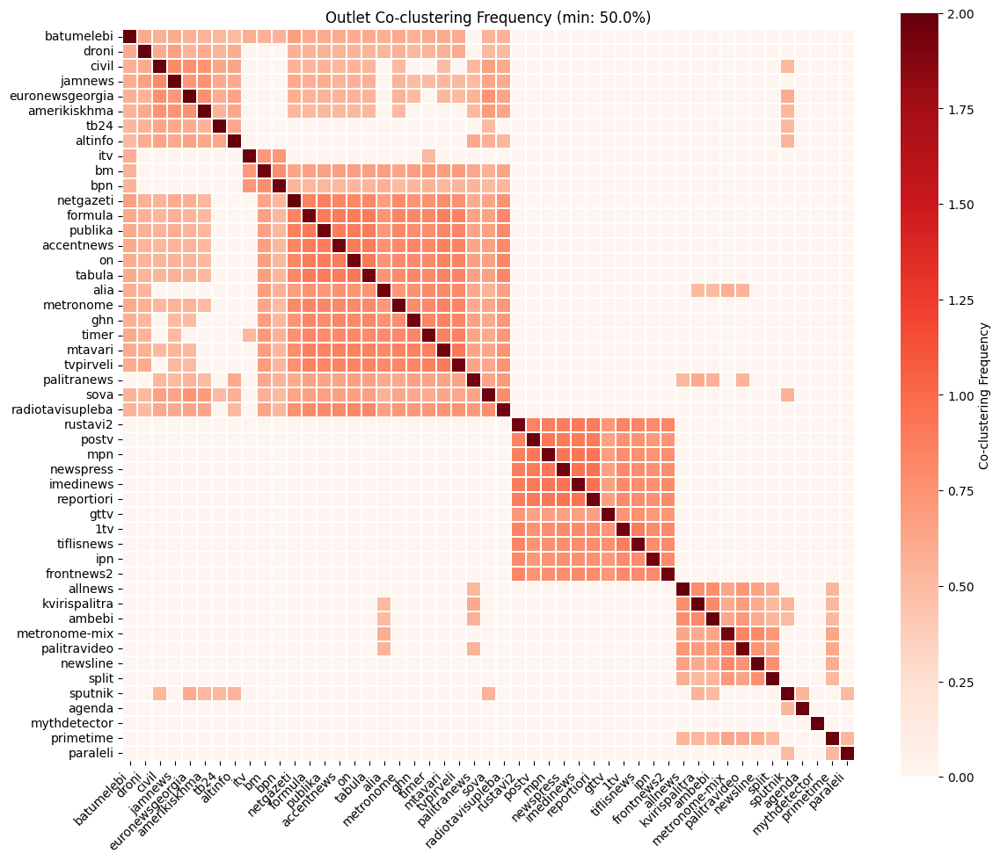

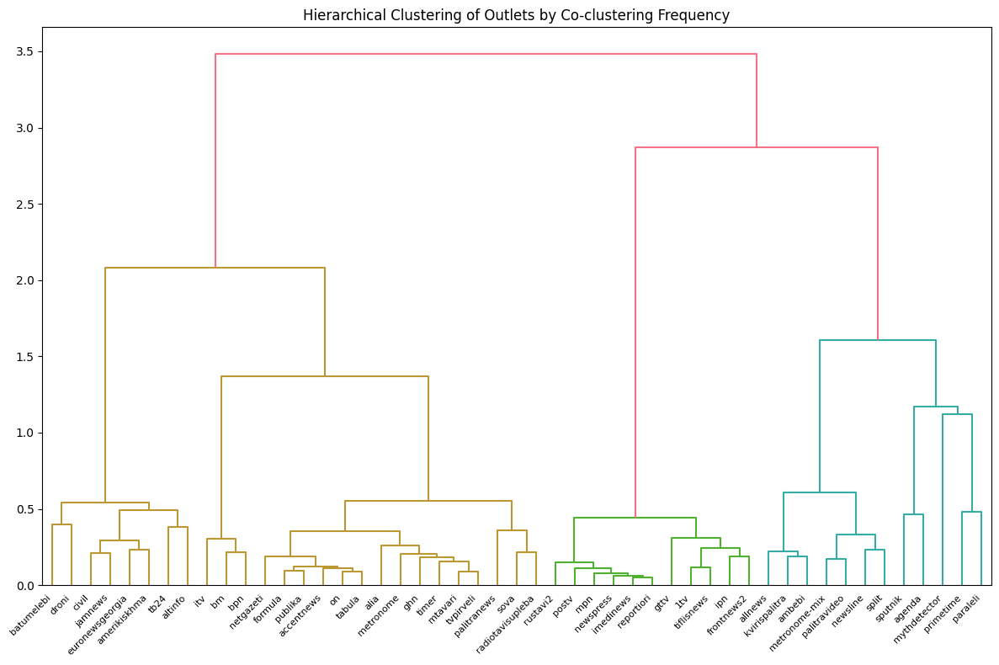


Outlet Co-clustering Analysis:
Outlets analyzed: 49
Pairs above 50.0% threshold: 352
Mean frequency: 0.676
Max frequency: 0.952


In [90]:
# plot outlet co-clustering heatmap
def plot_outlet_cooccurrence(min_frequency: float = 0.5, dataset: str = None,
                            figsize: tuple = (12, 10)) -> None:
    """plot heatmap showing which outlets frequently cluster together"""
    cooccurrence = analyzer.outlet_clustering_frequency(
        min_frequency=min_frequency, dataset=dataset)
    
    if cooccurrence.empty:
        print("no outlet cooccurrence data available")
        return
    
    plt.figure(figsize=figsize)
    
    # cluster outlets by similarity
    distance_matrix = 1 - cooccurrence.values
    np.fill_diagonal(distance_matrix, 0)
    condensed_distances = squareform(distance_matrix)
    linkage_matrix = linkage(condensed_distances, method='ward')
    dendro = dendrogram(linkage_matrix, labels=cooccurrence.index, no_plot=True)
    
    # reorder matrix by clustering
    order = dendro['leaves']
    cooccurrence_ordered = cooccurrence.iloc[order, order]
    
    sns.heatmap(cooccurrence_ordered, annot=False, cmap='Reds', 
                square=True, linewidths=0.1, cbar_kws={'label': 'Co-clustering Frequency'},
                xticklabels=True, yticklabels=True)
    
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    
    title = f'Outlet Co-clustering Frequency (min: {min_frequency:.1%})'
    if dataset:
        title += f' - {dataset} dataset'
    plt.title(title)
    plt.tight_layout()
    plt.show()
    
    # plot hierarchical clustering dendrogram
    plt.figure(figsize=(12, 8))
    dendrogram(linkage_matrix, labels=cooccurrence.index, orientation='top')
    plt.xticks(rotation=45, ha='right')
    plt.title('Hierarchical Clustering of Outlets by Co-clustering Frequency')
    plt.tight_layout()
    plt.show()
    
    # print summary
    frequencies = cooccurrence.values[np.triu_indices_from(cooccurrence.values, k=1)]
    above_threshold = frequencies[frequencies >= min_frequency]
    
    print(f"\nOutlet Co-clustering Analysis:")
    print(f"Outlets analyzed: {len(cooccurrence)}")
    print(f"Pairs above {min_frequency:.1%} threshold: {len(above_threshold)}")
    if len(above_threshold) > 0:
        print(f"Mean frequency: {above_threshold.mean():.3f}")
        print(f"Max frequency: {above_threshold.max():.3f}")
    
    return linkage_matrix, cooccurrence.index

linkage_matrix, cooccurrence_index = plot_outlet_cooccurrence(min_frequency=0.5)

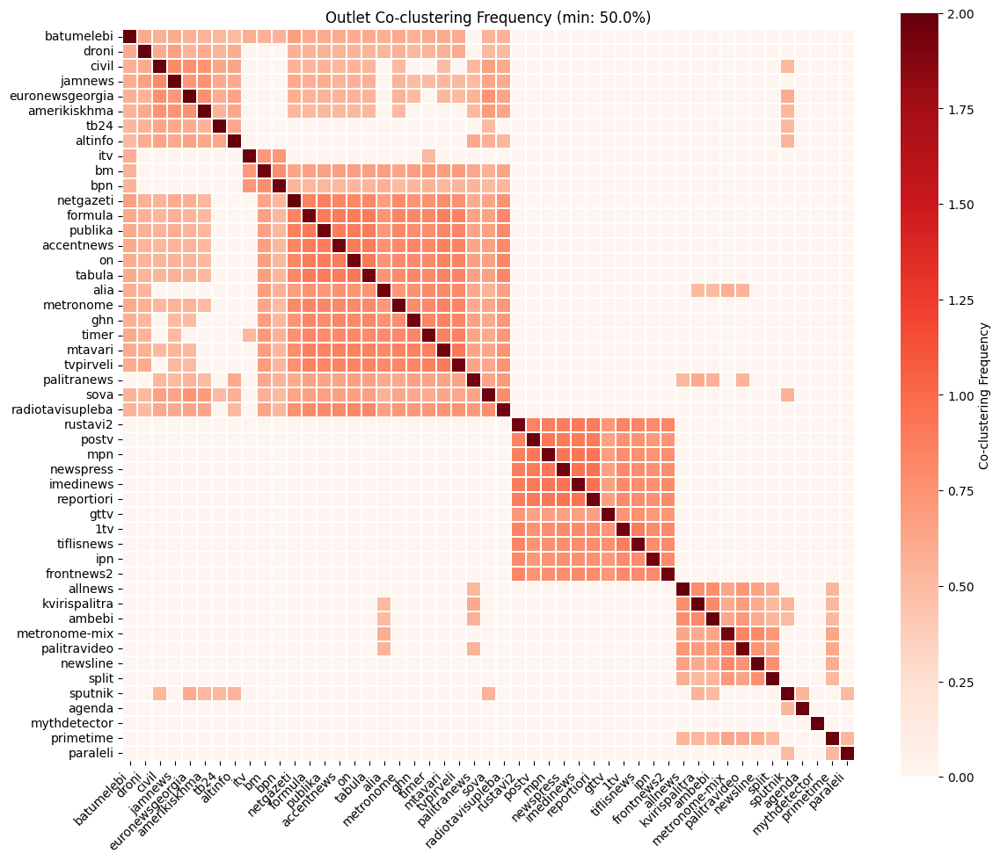


Outlet Co-clustering Analysis:
Outlets analyzed: 49
Pairs above 50.0% threshold: 352
Mean frequency: 0.676
Max frequency: 0.952


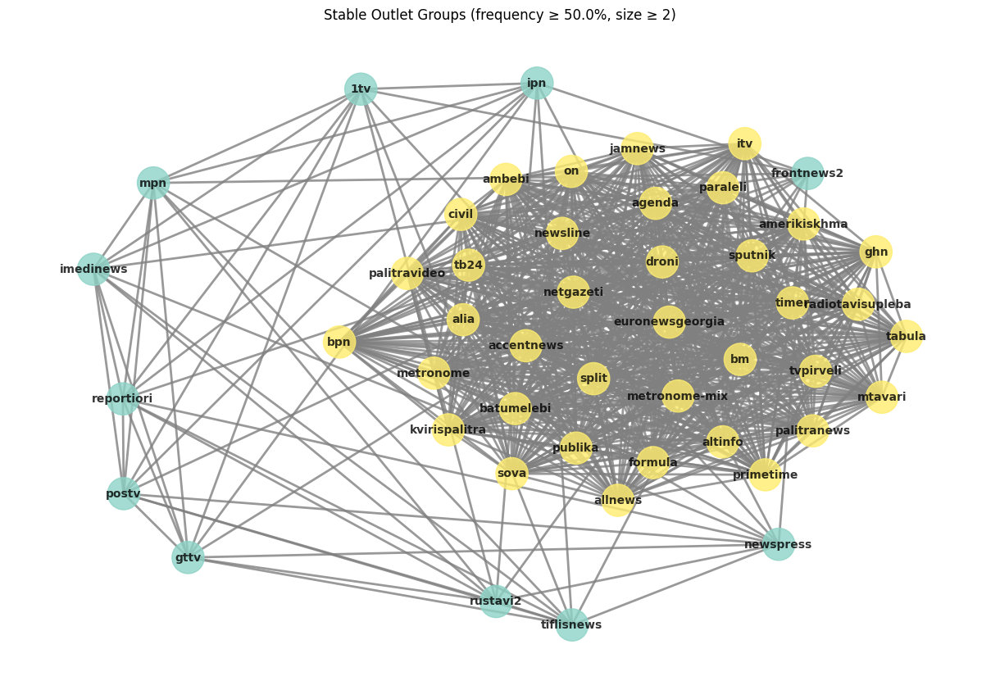


Stable Outlet Groups Found (2):
--------------------------------------------------
1. stable_group_1: 11 outlets
   Members: 1tv, frontnews2, gttv, imedinews, ipn, mpn, newspress, postv, reportiori, rustavi2, tiflisnews

2. stable_group_2: 37 outlets
   Members: accentnews, agenda, alia, allnews, altinfo, ambebi, amerikiskhma, batumelebi, bm, bpn, civil, droni, euronewsgeorgia, formula, ghn, itv, jamnews, kvirispalitra, metronome, metronome-mix, mtavari, netgazeti, newsline, on, palitranews, palitravideo, paraleli, primetime, publika, radiotavisupleba, sova, split, sputnik, tabula, tb24, timer, tvpirveli



In [84]:
# =============================================================================
# 8. ANALYZING CO-CLUSTERING FREQUENCIES
# =============================================================================
viz.plot_outlet_cooccurrence(min_frequency=0.5)
viz.plot_stable_outlet_groups(frequency_threshold=0.5, min_group_size=2)



=== TRUE CLUSTERING DERIVATION ===
Building consensus clusters...

CONSENSUS THRESHOLD ANALYSIS:
    threshold  n_clusters  largest_cluster  coverage
0        0.30           1               49       1.0
1        0.35           1               49       1.0
2        0.40           1               49       1.0
3        0.45           1               49       1.0
4        0.50           2               38       1.0
5        0.55           5               35       1.0
6        0.60           7               26       1.0
7        0.65           9               24       1.0
8        0.70          14               18       1.0
9        0.75          19               15       1.0
10       0.80          26               12       1.0
11       0.85          35                9       1.0
12       0.90          42                5       1.0
13       0.95          49                1       1.0


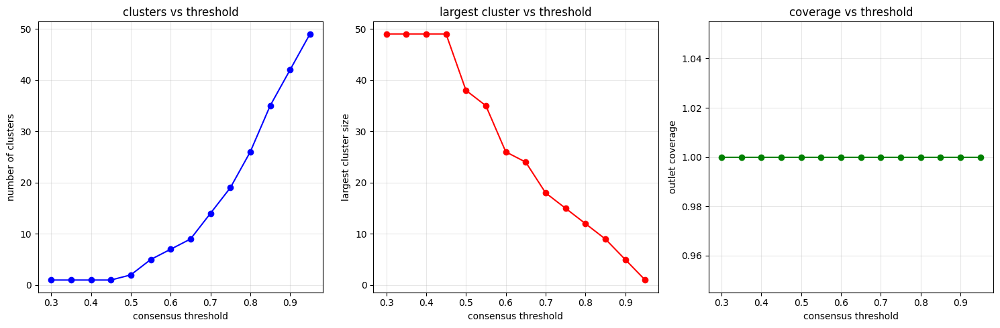


VIABLE THRESHOLDS (2 found):
   threshold  n_clusters  largest_cluster  coverage
4       0.50           2               38       1.0
5       0.55           5               35       1.0

THRESHOLD EVALUATION:
• 0.55: total=-3.600 (cluster=1.000, coverage=1.000, balance=-5.600)
• 0.50: total=-16.100 (cluster=0.500, coverage=1.000, balance=-17.600)

FINAL CONSENSUS CLUSTERING:
• Optimal threshold: 0.55
• Number of clusters: 5
• Largest cluster: 35 outlets
• Coverage: 100.0%


In [ ]:
# # %%

# # =============================================================================
# # 8. TRUE CLUSTERING DERIVATION
# # =============================================================================

# print("\n=== TRUE CLUSTERING DERIVATION ===")

# # step 1: calculate method reliability scores
# method_reliability = {}
# stability_data = analyzer.analyze_stability()

# if not stability_data.empty:
#     for _, row in stability_data.iterrows():
#         method_key = f"{row['network_method']}_{row['community_method']}"
#         method_reliability[method_key] = row['stability_score']

# # step 2: build weighted consensus using outlet co-occurrence
# print("Building consensus clusters...")

# # get outlet co-occurrence with different thresholds
# consensus_thresholds = [0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]
# consensus_results = {}

# for threshold in consensus_thresholds:
#     cooccurrence = analyzer.outlet_clustering_frequency(min_frequency=threshold)
    
#     if not cooccurrence.empty and cooccurrence.shape[0] > 1:
#         # find connected components in thresholded co-occurrence matrix
#         import networkx as nx
#         G = nx.from_pandas_adjacency(cooccurrence)
#         components = list(nx.connected_components(G))
        
#         # create cluster assignment
#         cluster_assignment = {}
#         for cluster_id, component in enumerate(components):
#             for outlet in component:
#                 cluster_assignment[outlet] = cluster_id
        
#         consensus_results[threshold] = {
#             'n_clusters': len(components),
#             'clusters': cluster_assignment,
#             'largest_cluster': max(len(c) for c in components) if components else 0,
#             'coverage': len(cluster_assignment) / len(cooccurrence) if len(cooccurrence) > 0 else 0
#         }

# # analyze consensus results
# print("\nCONSENSUS THRESHOLD ANALYSIS:")
# consensus_df = pd.DataFrame([
#     {
#         'threshold': thresh,
#         'n_clusters': data['n_clusters'],
#         'largest_cluster': data['largest_cluster'],
#         'coverage': data['coverage']
#     }
#     for thresh, data in consensus_results.items()
# ])

# if not consensus_df.empty:
#     print(consensus_df.round(3))
    
#     # plot threshold analysis
#     fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
#     axes[0].plot(consensus_df['threshold'], consensus_df['n_clusters'], 'o-', color='blue')
#     axes[0].set_xlabel('consensus threshold')
#     axes[0].set_ylabel('number of clusters')
#     axes[0].set_title('clusters vs threshold')
#     axes[0].grid(True, alpha=0.3)
    
#     axes[1].plot(consensus_df['threshold'], consensus_df['largest_cluster'], 'o-', color='red')
#     axes[1].set_xlabel('consensus threshold')
#     axes[1].set_ylabel('largest cluster size')
#     axes[1].set_title('largest cluster vs threshold')
#     axes[1].grid(True, alpha=0.3)
    
#     axes[2].plot(consensus_df['threshold'], consensus_df['coverage'], 'o-', color='green')
#     axes[2].set_xlabel('consensus threshold')
#     axes[2].set_ylabel('outlet coverage')
#     axes[2].set_title('coverage vs threshold')
#     axes[2].grid(True, alpha=0.3)
    
#     plt.tight_layout()
#     plt.show()

# # select optimal threshold by evaluating all viable options
# if not consensus_df.empty:
#     # find all thresholds with reasonable cluster count (2-6) and good coverage
#     viable_thresholds = consensus_df[
#         (consensus_df['n_clusters'] >= 2) & 
#         (consensus_df['n_clusters'] <= 6) & 
#         (consensus_df['coverage'] >= 0.7)
#     ]
    
#     if not viable_thresholds.empty:
#         print(f"\nVIABLE THRESHOLDS ({len(viable_thresholds)} found):")
#         print(viable_thresholds.round(3))
        
#         # evaluate each viable threshold using multiple criteria
#         threshold_scores = []
#         for _, row in viable_thresholds.iterrows():
#             threshold = row['threshold']
            
#             # scoring criteria (higher is better)
#             cluster_score = 1.0 / abs(row['n_clusters'] - 4)  # prefer ~4 clusters
#             coverage_score = row['coverage']  # prefer high coverage
#             balance_score = 1.0 - abs(row['largest_cluster'] / row['n_clusters'] - 0.4)  # prefer balanced clusters
            
#             total_score = cluster_score + coverage_score + balance_score
            
#             threshold_scores.append({
#                 'threshold': threshold,
#                 'cluster_score': cluster_score,
#                 'coverage_score': coverage_score,
#                 'balance_score': balance_score,
#                 'total_score': total_score
#             })
        
#         # select best threshold
#         best_threshold_data = max(threshold_scores, key=lambda x: x['total_score'])
#         optimal_threshold = best_threshold_data['threshold']
#         final_clustering = consensus_results[optimal_threshold]
        
#         print(f"\nTHRESHOLD EVALUATION:")
#         for score_data in sorted(threshold_scores, key=lambda x: x['total_score'], reverse=True):
#             print(f"{score_data['threshold']:.2f}: total={score_data['total_score']:.3f} "
#                   f"(cluster={score_data['cluster_score']:.3f}, "
#                   f"coverage={score_data['coverage_score']:.3f}, "
#                   f"balance={score_data['balance_score']:.3f})")
        
#         print(f"\nFINAL CONSENSUS CLUSTERING:")
#         print(f"Optimal threshold: {optimal_threshold}")
#         print(f"Number of clusters: {final_clustering['n_clusters']}")
#         print(f"Largest cluster: {final_clustering['largest_cluster']} outlets")
#         print(f"Coverage: {final_clustering['coverage']:.1%}")
#     else:
#         print("No viable consensus threshold found. Using 0.5 as fallback.")
#         optimal_threshold = 0.5
#         final_clustering = consensus_results.get(0.5, {'clusters': {}, 'n_clusters': 0})


=== CLUSTER VALIDATION ===
Performing k-means clustering validation...
K-means vs consensus agreement: 0.776
K-means silhouette score: 0.284

FINAL CLUSTER CHARACTERIZATION:

Cluster 1 (11 outlets):
  Members: 1tv, frontnews2, gttv, imedinews, ipn, mpn, newspress, postv, reportiori, rustavi2, tiflisnews

Cluster 2 (35 outlets):
  Members: accentnews, alia, allnews, altinfo, ambebi, amerikiskhma, batumelebi, bm, bpn, civil, droni, euronewsgeorgia, formula, ghn, itv, jamnews, kvirispalitra, metronome, metronome-mix, mtavari, netgazeti, newsline, on, palitranews, palitravideo, primetime, publika, radiotavisupleba, sova, split, sputnik, tabula, tb24, timer, tvpirveli

Cluster 3 (1 outlets):
  Members: mythdetector

Cluster 4 (1 outlets):
  Members: paraleli

Cluster 5 (1 outlets):
  Members: agenda


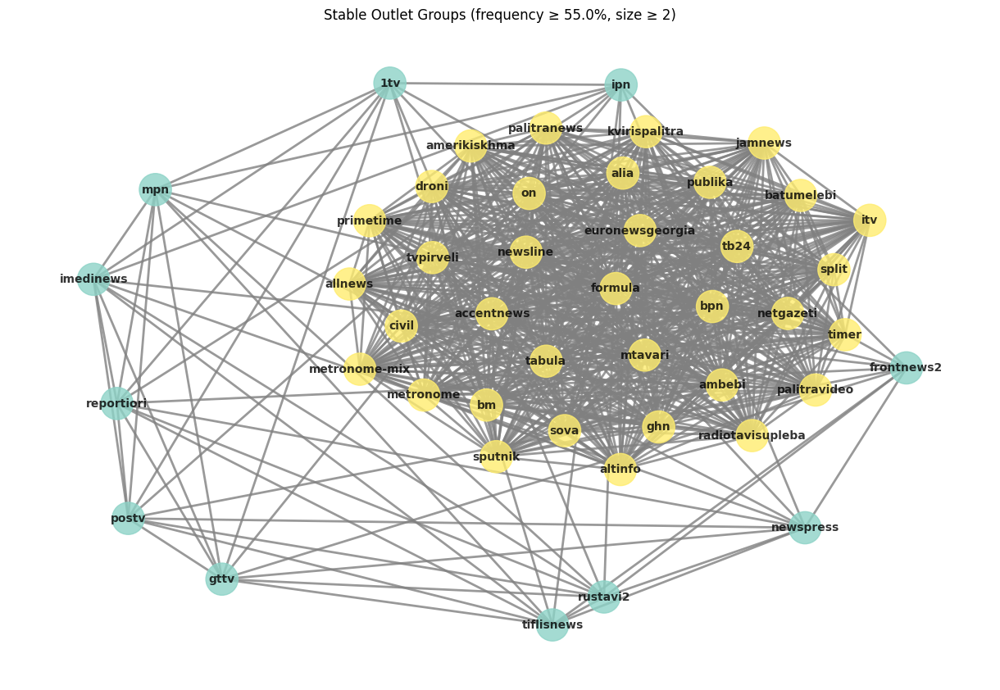


Stable Outlet Groups Found (2):
--------------------------------------------------
1. stable_group_1: 11 outlets
   Members: 1tv, frontnews2, gttv, imedinews, ipn, mpn, newspress, postv, reportiori, rustavi2, tiflisnews

2. stable_group_2: 35 outlets
   Members: accentnews, alia, allnews, altinfo, ambebi, amerikiskhma, batumelebi, bm, bpn, civil, droni, euronewsgeorgia, formula, ghn, itv, jamnews, kvirispalitra, metronome, metronome-mix, mtavari, netgazeti, newsline, on, palitranews, palitravideo, primetime, publika, radiotavisupleba, sova, split, sputnik, tabula, tb24, timer, tvpirveli



In [34]:
# # %%
# # =============================================================================
# # 9. CLUSTER VALIDATION & CHARACTERIZATION
# # =============================================================================

# print("\n=== CLUSTER VALIDATION ===")

# if 'final_clustering' in locals() and final_clustering['clusters']:
#     clusters = final_clustering['clusters']
    
#     # k-means clustering validation
#     print("Performing k-means clustering validation...")
#     from sklearn.cluster import KMeans
#     from sklearn.preprocessing import StandardScaler
    
#     # prepare data for k-means
#     cooccurrence_matrix = analyzer.outlet_clustering_frequency(min_frequency=0.1)
#     if not cooccurrence_matrix.empty:
#         # convert to distance matrix and standardize
#         distance_matrix = 1 - cooccurrence_matrix.fillna(0)
#         scaler = StandardScaler()
#         scaled_distances = scaler.fit_transform(distance_matrix)
        
#         # perform k-means with same number of clusters as consensus
#         n_clusters = final_clustering['n_clusters']
#         kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
#         kmeans_labels = kmeans.fit_predict(scaled_distances)
        
#         # create k-means clustering dictionary
#         outlets = distance_matrix.index.tolist()
#         kmeans_clusters = {outlet: label for outlet, label in zip(outlets, kmeans_labels)}
        
#         # compare k-means with consensus clustering
#         agreement_count = 0
#         total_pairs = 0
        
#         outlet_pairs = [(o1, o2) for o1 in clusters.keys() for o2 in clusters.keys() if o1 < o2]
#         for o1, o2 in outlet_pairs:
#             if o1 in kmeans_clusters and o2 in kmeans_clusters:
#                 consensus_same = clusters[o1] == clusters[o2]
#                 kmeans_same = kmeans_clusters[o1] == kmeans_clusters[o2]
#                 if consensus_same == kmeans_same:
#                     agreement_count += 1
#                 total_pairs += 1
        
#         if total_pairs > 0:
#             kmeans_agreement = agreement_count / total_pairs
#             print(f"K-means vs consensus agreement: {kmeans_agreement:.3f}")
        
#         # silhouette score for k-means
#         silhouette_avg = silhouette_score(scaled_distances, kmeans_labels)
#         print(f"K-means silhouette score: {silhouette_avg:.3f}")
    
#     # cluster characterization
#     print("\nFINAL CLUSTER CHARACTERIZATION:")
#     cluster_sizes = Counter(clusters.values())
    
#     for cluster_id in sorted(cluster_sizes.keys()):
#         outlets_in_cluster = [outlet for outlet, cid in clusters.items() if cid == cluster_id]
#         print(f"\nCluster {cluster_id + 1} ({len(outlets_in_cluster)} outlets):")
#         print(f"  Members: {', '.join(sorted(outlets_in_cluster))}")
    
#     # visualize final clustering
#     viz.plot_stable_outlet_groups(frequency_threshold=optimal_threshold, min_group_size=2)


In [13]:
# # %%

# # =============================================================================
# # 10. COMPREHENSIVE SUMMARY & CONCLUSIONS
# # =============================================================================

# print("\n" + "="*60)
# print("COMPREHENSIVE ANALYSIS SUMMARY")
# print("="*60)

# # research question 1: stability
# print("\n1. STABILITY ACROSS METHODOLOGIES:")
# if 'sim_df' in locals() and not sim_df.empty:
#     high_agreement_rate = (sim_df['ari_score'] > 0.7).mean()
#     mean_agreement = sim_df['ari_score'].mean()
#     print(f"   Average method agreement (ARI): {mean_agreement:.3f}")
#     print(f"   High agreement rate (>0.7): {high_agreement_rate:.1%}")
    
#     if high_agreement_rate > 0.3:
#         print(f"   → CONCLUSION: Moderate to high stability across methods")
#     elif high_agreement_rate > 0.1:
#         print(f"   → CONCLUSION: Some stability, but significant method variation")
#     else:
#         print(f"   → CONCLUSION: Low stability, high sensitivity to method choice")

# # research question 2: true clustering
# print("\n2. DERIVED TRUE CLUSTERING:")
# if 'final_clustering' in locals() and final_clustering['clusters']:
#     print(f"   Consensus threshold: {optimal_threshold}")
#     print(f"   Number of stable clusters: {final_clustering['n_clusters']}")
#     print(f"   Outlet coverage: {final_clustering['coverage']:.1%}")
#     if 'bootstrap_stability' in locals() and bootstrap_stability:
#         print(f"   Bootstrap validation: {np.mean(bootstrap_stability):.3f}")
    
#     if final_clustering['coverage'] > 0.8 and final_clustering['n_clusters'] >= 3:
#         print("   → CONCLUSION: Strong consensus clustering identified")
#     elif final_clustering['coverage'] > 0.6:
#         print("   → CONCLUSION: Moderate consensus clustering identified")
#     else:
#         print("   → CONCLUSION: Weak consensus, clustering uncertain")
# else:
#     print("   → CONCLUSION: No clear consensus clustering found")

# # methodological insights
# print("\n3. METHODOLOGICAL INSIGHTS:")
# if 'param_df' in locals():
#     most_stable = param_df.iloc[0]['method']
#     print(f"   Most parameter-stable method: {most_stable}")

# survival_rate_mean = method_survival['survival_rate'].mean()
# print(f"   Average method survival rate: {survival_rate_mean:.1%}")

# if 'net_props_df' in locals():
#     avg_density = net_props_df['density'].mean()
#     print(f"   Average network density: {avg_density:.3f}")

# print("\n4. RECOMMENDATIONS:")
# if survival_rate_mean > 0.7:
#     print("   Most methods produce reasonable results - focus on consensus")
# elif survival_rate_mean > 0.4:
#     print("   Method selection is important - use stability analysis")
# else:
#     print("   High method sensitivity - consider ensemble approaches")

# if 'final_clustering' in locals() and final_clustering['n_clusters'] > 0:
#     print(f"   Use consensus clustering with {optimal_threshold} threshold")
#     print("   Validate results with bootstrap or cross-validation")

# print(f"\nTotal analysis time: {experiment_summary['total_time']:.1f}s")
# print(f"Results analyzed: {len(analyzer.get_results())}")
# print("="*60) 


COMPREHENSIVE ANALYSIS SUMMARY

1. STABILITY ACROSS METHODOLOGIES:
   • Average method agreement (ARI): 0.209
   • High agreement rate (>0.7): 7.7%
   → CONCLUSION: Low stability, high sensitivity to method choice

2. DERIVED TRUE CLUSTERING:
   • Consensus threshold: 0.5
   • Number of stable clusters: 2
   • Outlet coverage: 100.0%
   • Bootstrap validation: 0.654
   → CONCLUSION: Moderate consensus clustering identified

3. METHODOLOGICAL INSIGHTS:
   • Most parameter-stable method: k_cores
   • Average method survival rate: 38.7%
   • Average network density: 0.842

4. RECOMMENDATIONS:
   • High method sensitivity - consider ensemble approaches
   • Use consensus clustering with 0.5 threshold
   • Validate results with bootstrap or cross-validation

Total analysis time: 59.8s
Results analyzed: 4782



=== SAMPLING & VISUALIZING 3-5 COMMUNITY RESULTS ===
Found 2065 results with 3-5 communities

Visualizing 6 sampled results:

Sample 1: sample_12
conditional_probability + spectral_clustering
3 communities (top-3 edges per node)


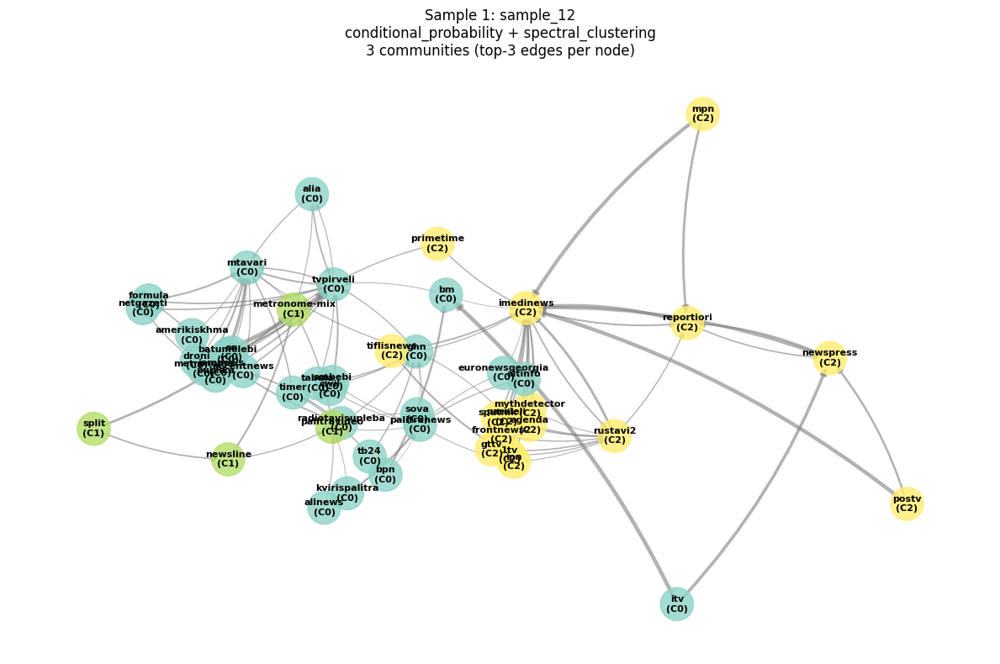

Graph stats for Sample 1: sample_12
conditional_probability + spectral_clustering
3 communities (top-3 edges per node):
  • Nodes: 49
  • Edges: 98
  • Communities: 3
  • Edge weight range: 0.170 - 0.911
  • Community members:
    C0: mtavari, ghn, euronewsgeorgia, bm, alia, timer, sova, tvpirveli, formula, netgazeti, radiotavisupleba, bpn, batumelebi, on, metronome, palitranews, publika, kvirispalitra, ambebi, allnews, accentnews, tabula, civil, jamnews, tb24, itv, droni, amerikiskhma, altinfo
    C1: metronome-mix, newsline, palitravideo, split
    C2: 1tv, newspress, imedinews, rustavi2, tiflisnews, mpn, ipn, gttv, mythdetector, sputnik, primetime, postv, paraleli, frontnews2, reportiori, agenda

Sample 2: sample_19
cooccurrence + louvain
3 communities (top-3 edges per node)


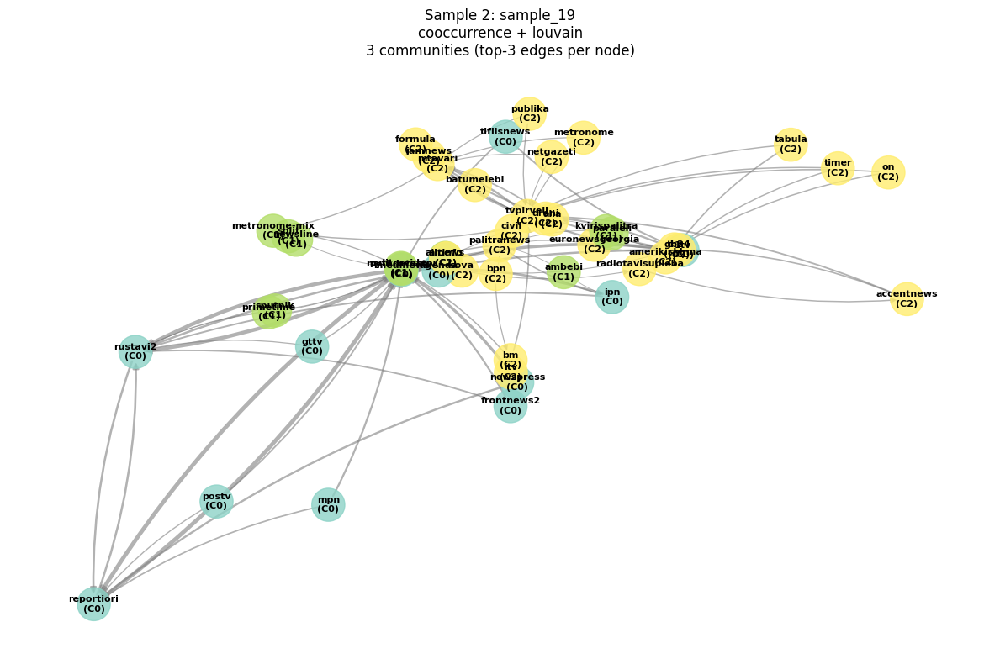

Graph stats for Sample 2: sample_19
cooccurrence + louvain
3 communities (top-3 edges per node):
  • Nodes: 49
  • Edges: 98
  • Communities: 3
  • Edge weight range: 0.002 - 1.000
  • Community members:
    C0: 1tv, newspress, imedinews, rustavi2, tiflisnews, mpn, ipn, gttv, postv, frontnews2, reportiori, agenda
    C1: metronome-mix, newsline, palitravideo, mythdetector, sputnik, primetime, kvirispalitra, ambebi, allnews, paraleli, split
    C2: mtavari, ghn, euronewsgeorgia, bm, alia, timer, sova, tvpirveli, formula, netgazeti, radiotavisupleba, bpn, batumelebi, on, metronome, palitranews, publika, accentnews, tabula, civil, jamnews, tb24, itv, droni, amerikiskhma, altinfo

Sample 3: sample_12
conditional_probability + spectral_clustering
3 communities (top-3 edges per node)


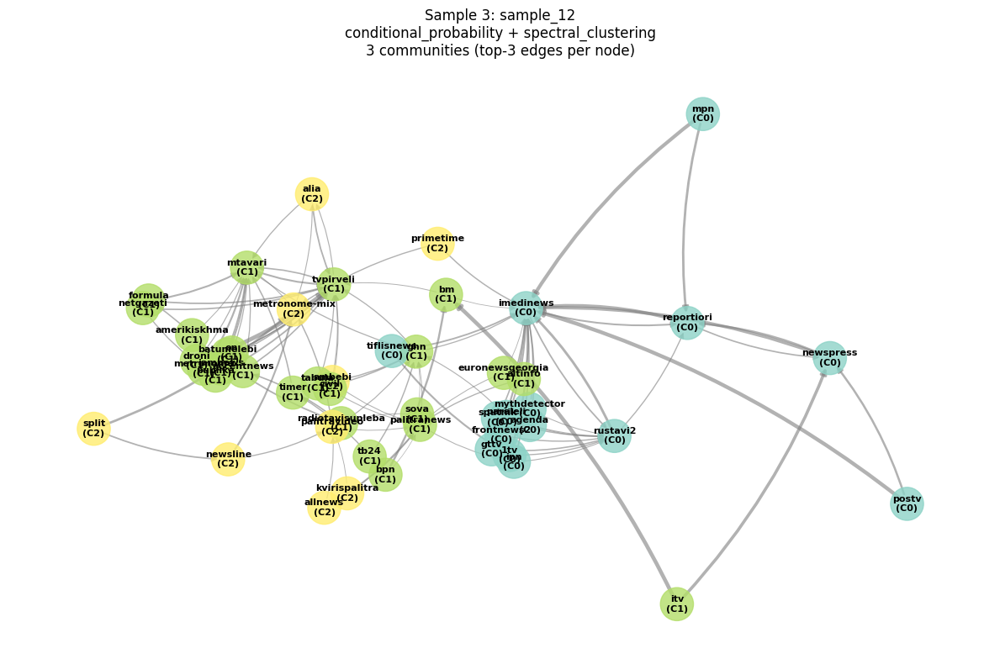

Graph stats for Sample 3: sample_12
conditional_probability + spectral_clustering
3 communities (top-3 edges per node):
  • Nodes: 49
  • Edges: 98
  • Communities: 3
  • Edge weight range: 0.170 - 0.911
  • Community members:
    C0: 1tv, newspress, imedinews, rustavi2, tiflisnews, mpn, ipn, gttv, mythdetector, sputnik, postv, paraleli, frontnews2, reportiori, agenda
    C1: mtavari, ghn, euronewsgeorgia, bm, timer, sova, tvpirveli, formula, netgazeti, radiotavisupleba, bpn, batumelebi, on, metronome, palitranews, publika, accentnews, tabula, civil, jamnews, tb24, itv, droni, amerikiskhma, altinfo
    C2: alia, metronome-mix, newsline, palitravideo, primetime, kvirispalitra, ambebi, allnews, split

Sample 4: sample_12
conditional_probability + louvain
4 communities (top-3 edges per node)


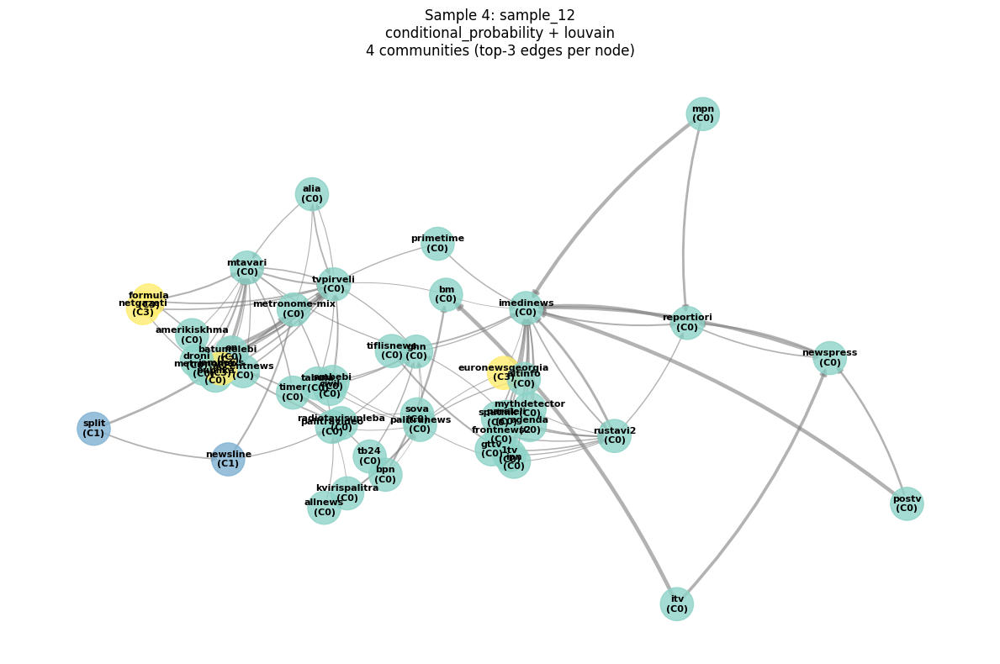

Graph stats for Sample 4: sample_12
conditional_probability + louvain
4 communities (top-3 edges per node):
  • Nodes: 49
  • Edges: 98
  • Communities: 4
  • Edge weight range: 0.170 - 0.911
  • Community members:
    C0: 1tv, mtavari, ghn, newspress, imedinews, bm, rustavi2, alia, tiflisnews, timer, sova, metronome-mix, tvpirveli, radiotavisupleba, mpn, bpn, ipn, on, metronome, palitranews, gttv, palitravideo, mythdetector, sputnik, primetime, postv, publika, kvirispalitra, ambebi, allnews, accentnews, tabula, civil, paraleli, tb24, itv, frontnews2, droni, reportiori, amerikiskhma, agenda, altinfo
    C1: newsline, split
    C2: batumelebi
    C3: euronewsgeorgia, formula, netgazeti, jamnews

Sample 5: sample_00
dice + louvain
4 communities (top-3 edges per node)


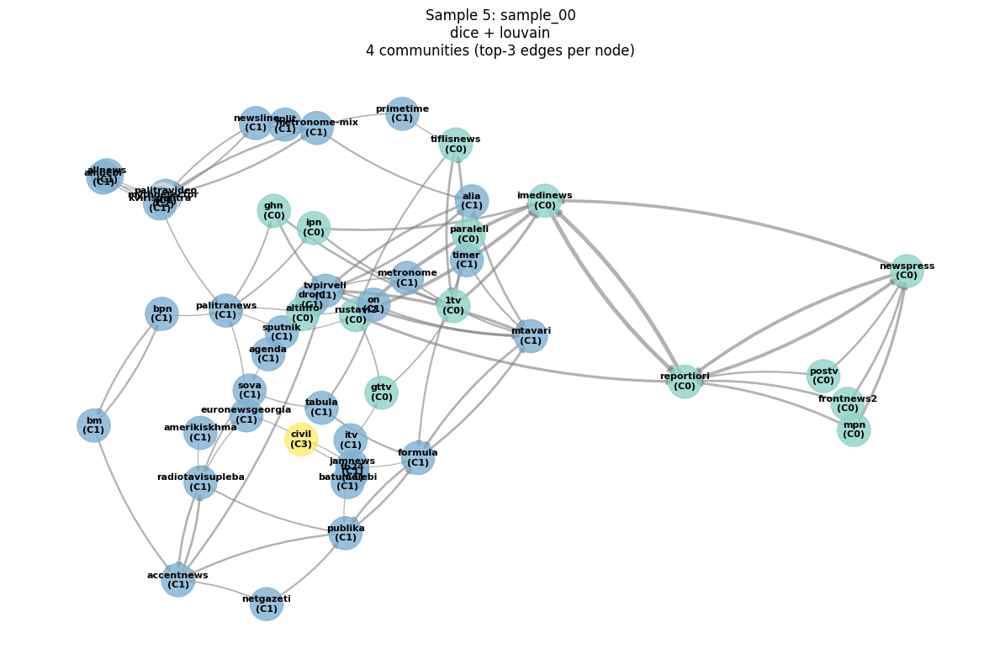

Graph stats for Sample 5: sample_00
dice + louvain
4 communities (top-3 edges per node):
  • Nodes: 49
  • Edges: 98
  • Communities: 4
  • Edge weight range: 0.008 - 0.555
  • Community members:
    C0: 1tv, ghn, newspress, imedinews, rustavi2, tiflisnews, mpn, ipn, gttv, postv, paraleli, frontnews2, reportiori, altinfo
    C1: mtavari, euronewsgeorgia, bm, alia, timer, sova, metronome-mix, tvpirveli, formula, netgazeti, radiotavisupleba, bpn, batumelebi, on, newsline, metronome, palitranews, palitravideo, sputnik, primetime, publika, kvirispalitra, ambebi, allnews, accentnews, tabula, jamnews, tb24, itv, droni, amerikiskhma, agenda, split
    C2: mythdetector
    C3: civil

Sample 6: sample_13
cosine + spectral_clustering
5 communities (top-3 edges per node)


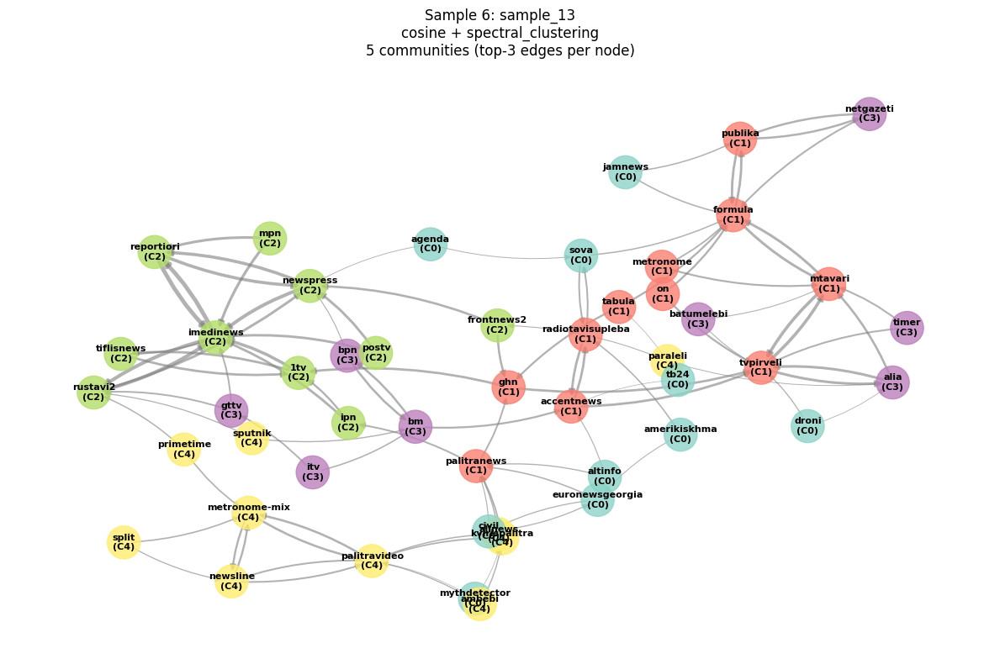

Graph stats for Sample 6: sample_13
cosine + spectral_clustering
5 communities (top-3 edges per node):
  • Nodes: 49
  • Edges: 98
  • Communities: 5
  • Edge weight range: 0.515 - 0.761
  • Community members:
    C0: euronewsgeorgia, sova, mythdetector, civil, jamnews, tb24, droni, amerikiskhma, agenda, altinfo
    C1: mtavari, ghn, tvpirveli, formula, radiotavisupleba, on, metronome, palitranews, publika, accentnews, tabula
    C2: 1tv, newspress, imedinews, rustavi2, tiflisnews, mpn, ipn, postv, frontnews2, reportiori
    C3: bm, alia, timer, netgazeti, bpn, batumelebi, gttv, itv
    C4: metronome-mix, newsline, palitravideo, sputnik, primetime, kvirispalitra, ambebi, allnews, paraleli, split


In [ ]:

# =============================================================================
# 11. SAMPLE VISUALIZATION OF 3-5 COMMUNITY RESULTS
# =============================================================================
from typing import Dict

print("\n=== SAMPLING & VISUALIZING 3-5 COMMUNITY RESULTS ===")

# filter results to those with 3-5 communities
filtered_results = analyzer.get_results()
community_filtered = filtered_results[
    (filtered_results['n_communities'] >= 3) & 
    (filtered_results['n_communities'] <= 5)
]

print(f"Found {len(community_filtered)} results with 3-5 communities")

if len(community_filtered) > 0:
    # sample 6 random results for visualization
    n_samples = min(6, len(community_filtered))
    sampled_results = community_filtered.sample(n=n_samples, random_state=42)

    def filter_top_k_edges(adj_matrix: pd.DataFrame, k: int = 3) -> pd.DataFrame:
        """filter adjacency matrix to keep only top k edges from each source"""
        filtered_adj = pd.DataFrame(0.0, index=adj_matrix.index, columns=adj_matrix.columns)
        
        for source in adj_matrix.index:
            # get top k targets for this source (excluding self)
            source_edges = adj_matrix.loc[source].copy()
            source_edges[source] = 0  # exclude self-loops
            
            # get top k values
            top_k_targets = source_edges.nlargest(k)
            
            # set these edges in filtered matrix
            for target, weight in top_k_targets.items():
                if weight > 0:  # only keep positive weights
                    filtered_adj.loc[source, target] = weight
        
        return filtered_adj

    def plot_network_graph(adj_matrix: pd.DataFrame, communities: Dict[int, int], 
                          title: str, k_edges: int = 1):
        """plot network graph with communities colored"""
        
        # filter to top k edges per source
        filtered_adj = filter_top_k_edges(adj_matrix, k=k_edges)
        
        # create networkx graph
        G = nx.from_pandas_adjacency(filtered_adj, create_using=nx.DiGraph())
        
        if G.number_of_nodes() == 0:
            print(f"Warning: No nodes in graph for {title}")
            return
        
        # remove nodes with no edges
        isolated_nodes = list(nx.isolates(G))
        G.remove_nodes_from(isolated_nodes)
        
        if G.number_of_nodes() == 0:
            print(f"Warning: No connected nodes in graph for {title}")
            return
        
        # create mapping between networkx node ids and original outlet names
        outlet_names = adj_matrix.index.tolist()
        
        # set up colors for communities
        unique_communities = list(set(communities.values()))
        colors = plt.cm.Set3(np.linspace(0, 1, len(unique_communities)))
        community_colors = {comm: colors[i] for i, comm in enumerate(unique_communities)}
        
        # node colors based on community membership
        node_colors = []
        node_labels = {}
        for node in G.nodes():
            # handle both string and integer node IDs
            if isinstance(node, str):
                # node is outlet name directly
                outlet_name = node
                try:
                    node_index = outlet_names.index(outlet_name)
                except ValueError:
                    node_index = None
            else:
                # node is an integer index
                if node < len(outlet_names):
                    outlet_name = outlet_names[node]
                    node_index = node
                else:
                    outlet_name = f"Node{node}"
                    node_index = None
            
            if node_index is not None and node_index in communities:
                community = communities[node_index]
                node_colors.append(community_colors[community])
                node_labels[node] = f"{outlet_name}\n(C{community})"
            else:
                node_colors.append('lightgray')
                node_labels[node] = f"{outlet_name}\n(C?)"
        
        # layout
        plt.figure(figsize=(12, 8))
        
        # try different layouts based on graph size
        if G.number_of_nodes() < 20:
            pos = nx.spring_layout(G, k=k_edges, iterations=50, seed=42)
        else:
            pos = nx.kamada_kawai_layout(G)
        
        # draw nodes
        nx.draw_networkx_nodes(G, pos, node_color=node_colors, 
                              node_size=800, alpha=0.8)
        
        # draw edges with weights
        edges = G.edges(data=True)
        edge_weights = [d['weight'] for u, v, d in edges]
        
        if edge_weights:
            # normalize edge weights for visualization
            max_weight = max(edge_weights)
            min_weight = min(edge_weights)
            if max_weight > min_weight:
                normalized_weights = [(w - min_weight) / (max_weight - min_weight) * 3 + 0.5 
                                    for w in edge_weights]
            else:
                normalized_weights = [1.0] * len(edge_weights)
            
            nx.draw_networkx_edges(G, pos, width=normalized_weights, 
                                 alpha=0.6, edge_color='gray', 
                                 connectionstyle="arc3,rad=0.1")
        
        # draw labels
        nx.draw_networkx_labels(G, pos, node_labels, font_size=8, font_weight='bold')
        
        plt.title(title)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        
        # print graph stats
        print(f"Graph stats for {title}:")
        print(f"  Nodes: {G.number_of_nodes()}")
        print(f"  Edges: {G.number_of_edges()}")
        print(f"  Communities: {len(unique_communities)}")
        if edge_weights:
            print(f"  Edge weight range: {min(edge_weights):.3f} - {max(edge_weights):.3f}")
        
        # print community members
        community_members = {}
        for node in G.nodes():
            # handle both string and integer node IDs
            if isinstance(node, str):
                # node is outlet name directly
                outlet_name = node
                try:
                    node_index = outlet_names.index(outlet_name)
                except ValueError:
                    node_index = None
            else:
                # node is an integer index
                if node < len(outlet_names):
                    outlet_name = outlet_names[node]
                    node_index = node
                else:
                    outlet_name = f"Node{node}"
                    node_index = None
            
            if node_index is not None and node_index in communities:
                community = communities[node_index]
                if community not in community_members:
                    community_members[community] = []
                community_members[community].append(outlet_name)
        
        if community_members:
            print(f"  Community members:")
            for comm_id, members in sorted(community_members.items()):
                print(f"    C{comm_id}: {', '.join(members)}")

    # visualize sampled results
    print(f"\nVisualizing {len(sampled_results)} sampled results:")
    
    for i, (_, result) in enumerate(sampled_results.iterrows(), 1):
        sample_id = result['sample_id']
        network_method = result['network_method']
        community_method = result['community_method']
        param_id = result['param_id']
        communities = result['communities']
        n_communities = result['n_communities']
        
        # get corresponding adjacency matrix
        adj_key = (sample_id, network_method)
        if adj_key in analyzer.adjacencies:
            adj_matrix = analyzer.adjacencies[adj_key]
            
            title = f"Sample {i}: {sample_id}\n{network_method} + {community_method}\n{n_communities} communities (top-3 edges per node)"
            
            print(f"\n{title}")
            plot_network_graph(adj_matrix, communities, title, k_edges=2)
        else:
            print(f"Warning: No adjacency matrix found for {adj_key}")

